# Training and Optimisation skitit Learn machine learning algorithms
Name: Patrick Noonan   
Student Number: 20355426   
Load in dataset and check datasets general size and structure.   

In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import tree, metrics
from sklearn.gaussian_process.kernels import Matern, RBF, RationalQuadratic, DotProduct
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.model_selection import GridSearchCV


In [108]:
training_file = "Datasets/wildfires_training.csv"
testing_file = "Datasets/wildfires_test.csv"
independant_cols = [ 'year', 'temp', 'humidity', 'rainfall', 'drought_code', 'buildup_index', 'day', 'month', 'wind_speed']
dependant_col = 'fire'

#load in the dataset and separate the independant and dependant variables for the training and testing datasets
df = pd.read_csv(training_file)
print(df.head())
print(df.shape)

x_train = df.loc[:,independant_cols]
print(x_train.head())
print(x_train.shape)

y_train = df.loc[:,dependant_col]
print(y_train.head())
print(y_train.shape)

df_test = pd.read_csv(testing_file)
print(df_test.head())
print(df_test.shape)

x_test = df_test.loc[:,independant_cols]
print(x_test.head())
print(x_test.shape)

y_test = df_test.loc[:,dependant_col]
print(y_test.head())
print(y_test.shape)

  fire  year  temp  humidity  rainfall  drought_code  buildup_index  day  \
0   no  2015    28        59       0.0          8.06           3.47    1   
1   no  2010    30        61       1.3          8.17           4.03    2   
2   no  2009    26        83      13.1          8.08           3.59    3   
3   no  2017    25        87       2.5          7.18           2.42    4   
4   no  2014    28        77       0.0         14.98           4.63    5   

   month  wind_speed  
0      6          19  
1      6          13  
2      6          22  
3      6          15  
4      6          18  
(154, 10)
   year  temp  humidity  rainfall  drought_code  buildup_index  day  month  \
0  2015    28        59       0.0          8.06           3.47    1      6   
1  2010    30        61       1.3          8.17           4.03    2      6   
2  2009    26        83      13.1          8.08           3.59    3      6   
3  2017    25        87       2.5          7.18           2.42    4      6   
4  20

## Mini Test each algorithm 
Doing a mini test using multiple sciket learn algorithms top see how their performances are and which ones can be improved the most.


In [144]:
classifiers = {
    "Random Forest": RandomForestClassifier(),
    "Logistic Regression": LogisticRegression(max_iter=500),
    "Decision Tree": DecisionTreeClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB(),
    "Gaussian Process": GaussianProcessClassifier(),
}

results = []
#iterate through each of the algorithms and then see each of there training and testing performances and append them to results aray to be checked
for name, classifier in classifiers.items():
    classifier.fit(x_train, y_train)
    
    y_pred = classifier.predict(x_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    results.append({
        "Classifier": name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
    })

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by='F1 Score', ascending=False)

print(results_df)


            Classifier  Accuracy  Precision  Recall  F1 Score
0        Random Forest      0.90   0.907200    0.90  0.900361
1  Logistic Regression      0.90   0.901127    0.90  0.900202
2        Decision Tree      0.86   0.867200    0.86  0.860506
4          Naive Bayes      0.86   0.859901    0.86  0.859600
5     Gaussian Process      0.82   0.821385    0.82  0.820364
3  K-Nearest Neighbors      0.80   0.803846    0.80  0.800644


## Testing the Naive Bayes Classifier
- testing the Naive Bayes classifier on the dataset
- Firstly we tune the hyperparameters of the prior which is the imbalance of the dataset towards a certain class 
- Started messing with Naive Bayes but found that the hyperparameter tuning didn't have a massive effect on its performance so switched to Gaussian Process and Decision Tree
- Some of the data interesting like the pink line increasing in accuracy as the alpha value increases which could be worth reporting on but decided to change to gaussian process algorithm as more interesting.

c:\Users\Patrick\Documents\MachineLearningAssignment1\mlenv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


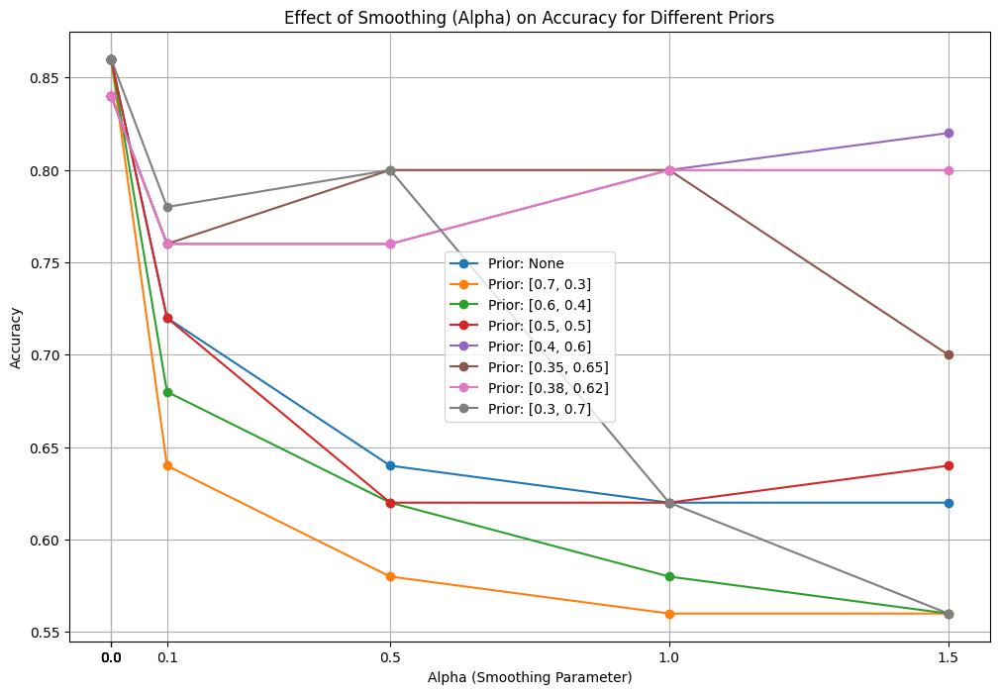

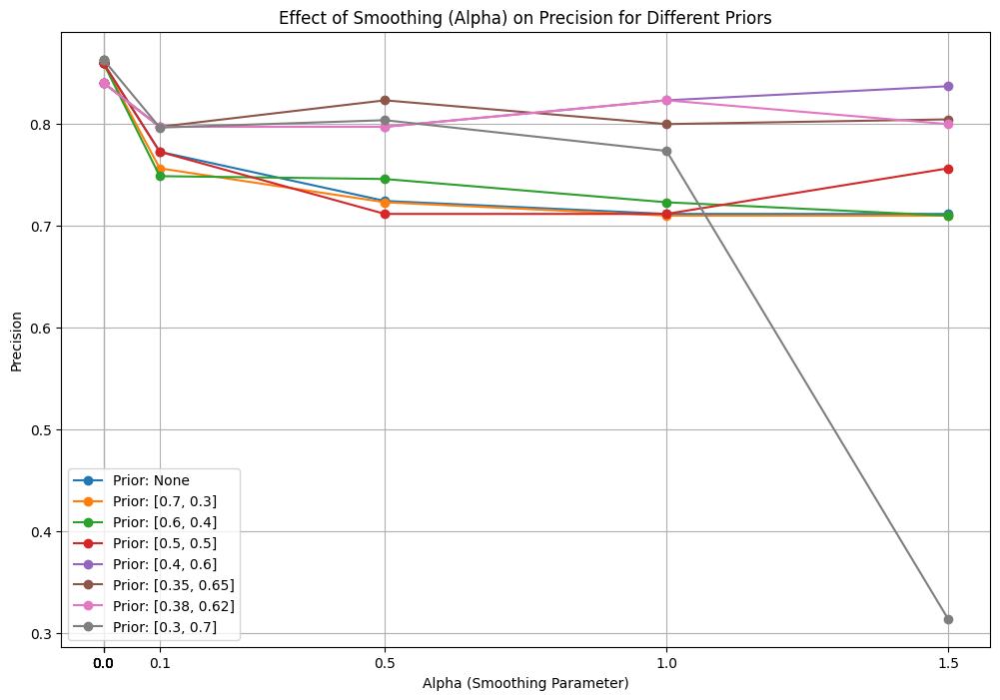

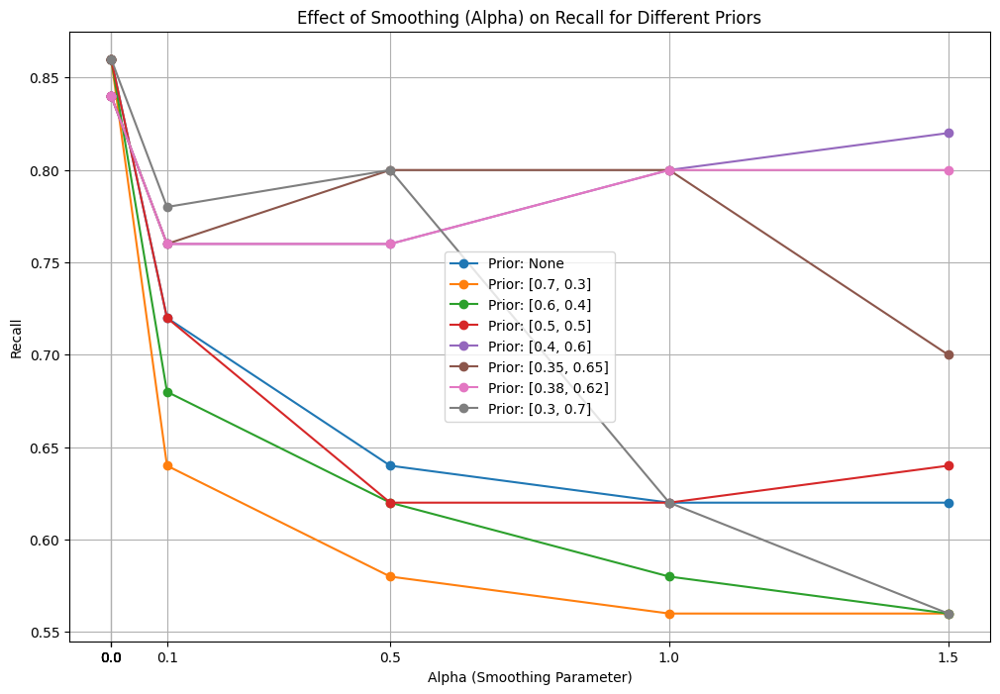

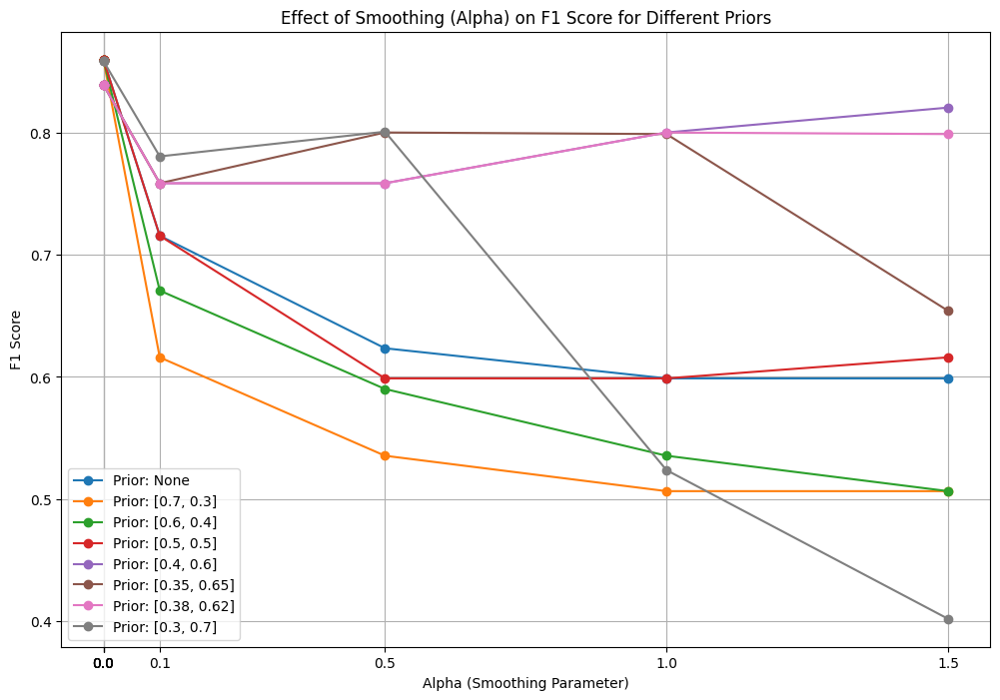

Best Results for Each Metric:
                     Prior     Alpha Accuracy Precision Recall  F1 Score
Best Accuracy         None  1.00e-09     0.86  0.859901   0.86    0.8596
Best Precision  [0.3, 0.7]  1.00e-09     0.86  0.863362   0.86  0.858437
Best Recall           None  1.00e-09     0.86  0.859901   0.86    0.8596
Best F1 Score         None  1.00e-09     0.86  0.859901   0.86    0.8596


In [149]:
alpha_values = np.array([1e-9, 1e-8, 1e-7, 1e-6, 0.1, 0.5, 1.0, 1.5])

priors = [None, [0.7, 0.3], [0.6, 0.4], [0.5, 0.5], [0.4, 0.6], [.35, .65], [.38, .62], [0.3, 0.7]]

results = []

#Basically iterated through all of the prior and alpha values to see the effect that they have on the performance of the model
#Some of the data interesting like the pink line increasing in accuracy as the alpha value increases which could be worth reporting on but decided to change to gaussian process algorithm as more interesting.
for prior in priors:
    for alpha in alpha_values:
        model = GaussianNB(var_smoothing=alpha, priors=prior)
        model.fit(x_train, y_train)
        #see how welel the model performs on the test data
        y_pred = model.predict(x_test)
        #GET THE DIFFERENT PERFORMANCE METRICS FOR THE MDOEL 
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')
        
        #strore in a results araray
        results.append({
            'Prior': str(prior),
            'Alpha': alpha,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        })

results_df = pd.DataFrame(results)

#We are going to reuse this function to plot each performance metric 
def plot_performance_metric(metric_name, results_df):
    plt.figure(figsize=(12, 8))
    
    for prior in results_df['Prior'].unique():
        plt.plot(results_df[results_df['Prior'] == prior]['Alpha'],
                 results_df[results_df['Prior'] == prior][metric_name],
                 marker='o', label=f'Prior: {prior}')
    
    plt.title(f'Effect of Smoothing (Alpha) on {metric_name} for Different Priors')
    plt.xlabel('Alpha (Smoothing Parameter)')
    plt.ylabel(metric_name)
    plt.xticks(alpha_values)  
    plt.legend()
    plt.grid(True)
    plt.show()

#reusing the above method 
plot_performance_metric('Accuracy', results_df)
plot_performance_metric('Precision', results_df)
plot_performance_metric('Recall', results_df)
plot_performance_metric('F1 Score', results_df)

#Had trouble finding the best result of each model because alot of the best performing results had an alpha of 0 so made method to print best results for each metric 
best_results = {
    'Best Accuracy': results_df.loc[results_df['Accuracy'].idxmax()],
    'Best Precision': results_df.loc[results_df['Precision'].idxmax()],
    'Best Recall': results_df.loc[results_df['Recall'].idxmax()],
    'Best F1 Score': results_df.loc[results_df['F1 Score'].idxmax()],
}

best_results_df = pd.DataFrame(best_results).T
best_results_df.columns = ['Prior', 'Alpha', 'Accuracy', 'Precision', 'Recall', 'F1 Score']
best_results_df['Alpha'] = best_results_df['Alpha'].apply(lambda x: f'{x:.2e}')

print("Best Results for Each Metric:")
print(best_results_df)



This is where I noticed although priot and alpha does have an effect on the data it isn't really considerable

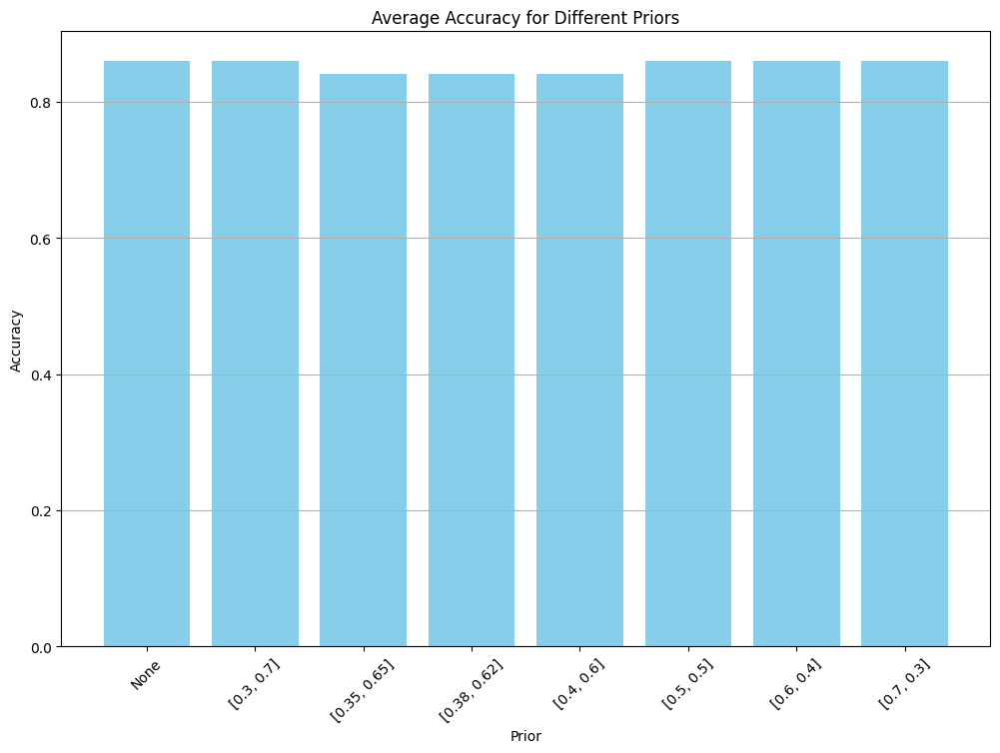

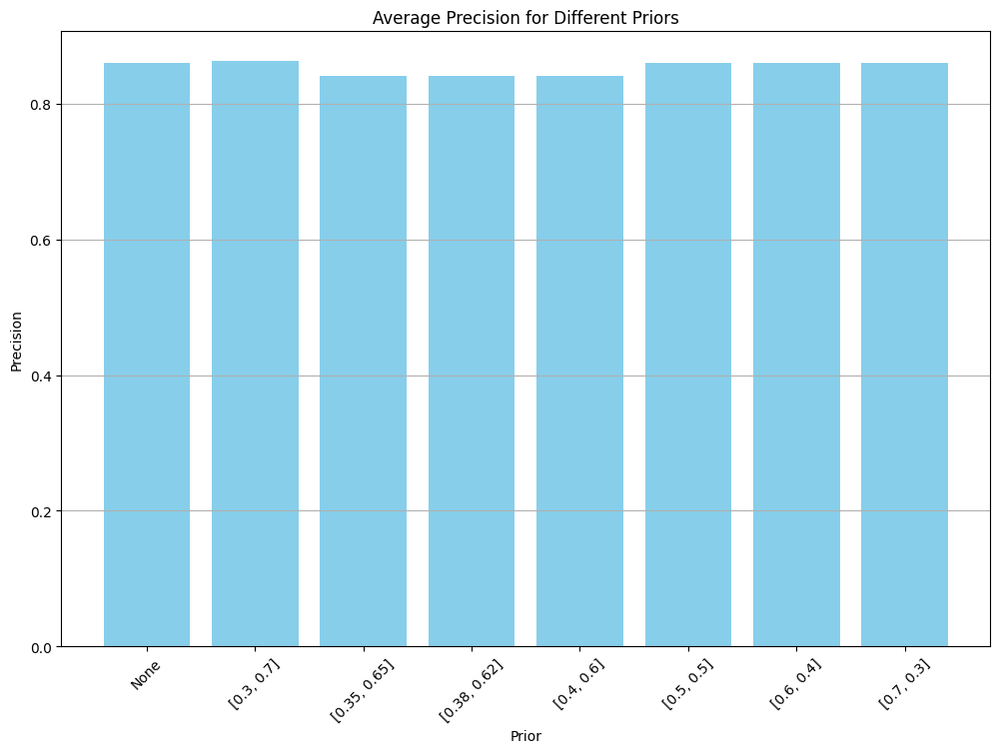

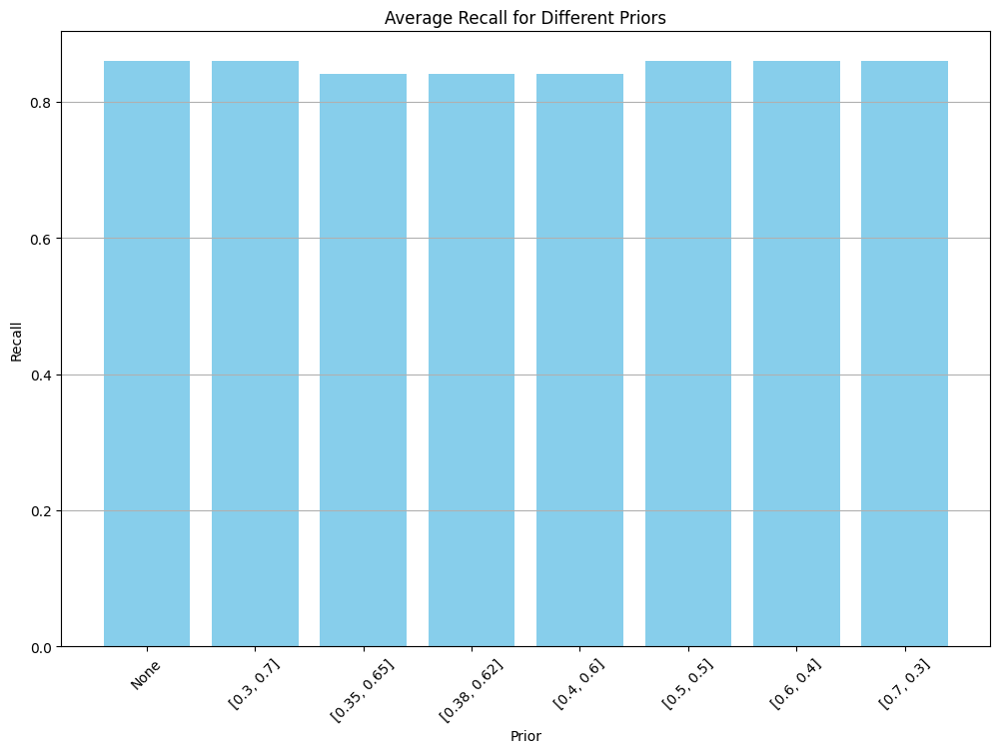

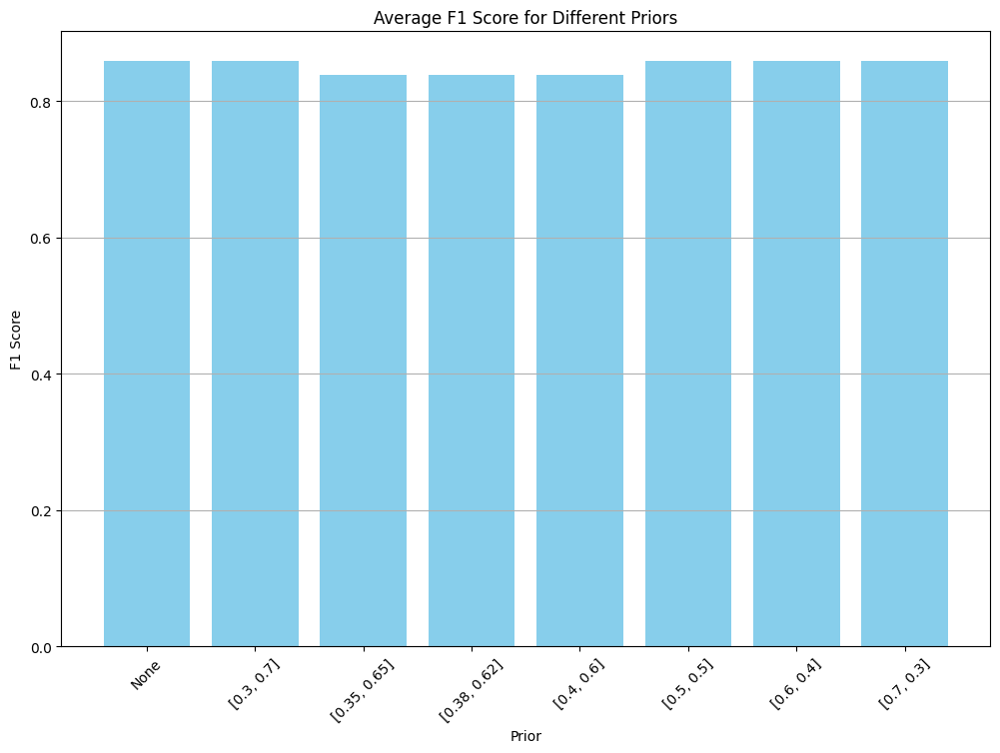

Best Results for Each Metric:
                     Prior Alpha Accuracy Precision Recall  F1 Score
Best Accuracy         None   1.5     0.86  0.859901   0.86    0.8596
Best Precision  [0.3, 0.7]   1.5     0.86  0.863362   0.86  0.858437
Best Recall           None   1.5     0.86  0.859901   0.86    0.8596
Best F1 Score         None   1.5     0.86  0.859901   0.86    0.8596


In [150]:
alpha_values = np.array([1e-9, 1e-8, 1e-7, 1e-6, 0.1, 0.5, 1.0, 1.5])
priors = [None, [0.7, 0.3], [0.6, 0.4], [0.5, 0.5], [0.4, 0.6], [0.35, 0.65], [0.38, 0.62], [0.3, 0.7]]
results = []

#Basically do the sanme as above but just priors and then just plot it in a bar chart to see the effect of the priors on the performance of the model
for prior in priors:
    model = GaussianNB(priors=prior)
    model.fit(x_train, y_train)

    y_pred = model.predict(x_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    results.append({
        'Prior': str(prior),
        'Alpha': alpha,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    })

results_df = pd.DataFrame(results)

grouped_results_df = results_df.groupby('Prior').mean().reset_index()

# Define a function to plot the performance metrics for different priors
def plot_grouped_performance(metric_name, grouped_results_df):
    plt.figure(figsize=(12, 8))
    plt.bar(grouped_results_df['Prior'], grouped_results_df[metric_name], color='skyblue')
    plt.title(f'Average {metric_name} for Different Priors')
    plt.xlabel('Prior')
    plt.ylabel(metric_name)
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.show()

# Plot for each metric
plot_grouped_performance('Accuracy', grouped_results_df)
plot_grouped_performance('Precision', grouped_results_df)
plot_grouped_performance('Recall', grouped_results_df)
plot_grouped_performance('F1 Score', grouped_results_df)

best_results = {
    'Best Accuracy': grouped_results_df.loc[grouped_results_df['Accuracy'].idxmax()],
    'Best Precision': grouped_results_df.loc[grouped_results_df['Precision'].idxmax()],
    'Best Recall': grouped_results_df.loc[grouped_results_df['Recall'].idxmax()],
    'Best F1 Score': grouped_results_df.loc[grouped_results_df['F1 Score'].idxmax()],
}

# Create a DataFrame for better display
best_results_df = pd.DataFrame(best_results).T
best_results_df.columns = ['Prior', 'Alpha', 'Accuracy', 'Precision', 'Recall', 'F1 Score']
# Print the best results
print("Best Results for Each Metric:")
print(best_results_df)


## Training data on Decision tree algorithm and assesing results
- Test and training data is read in.   
- Train model using decision tree classifier.   
- Test the accuracy of the training on the training dataset and testing dataset.   

In [151]:
model = tree.DecisionTreeClassifier()
model.fit(x_train, y_train)

predictions_train = model.predict(x_train)
predictions_test = model.predict(x_test)

accuracy_train = metrics.accuracy_score(y_train, predictions_train)
accuracy_test = metrics.accuracy_score(y_test, predictions_test)
print("Accuracy on training data: ", accuracy_train)
print("Accuracy on testing data: ", accuracy_test)
#Emded the plot in the notebook
%matplotlib inline  
plt.figure(figsize=(30,20))
tree.plot_tree(model, filled=True, feature_names=independant_cols)

Accuracy on training data:  1.0
Accuracy on testing data:  0.86


UsageError: unrecognized arguments: #Emded the plot in the notebook


### Changing hyper parameters slightly
- We will now change some of the hyperparameters as you can see the 'gini' characteristic is 0 at each leaf node in the tree above. This and the tree's depth suggests that is overfit to the data and the fact it performs so well on the training dataset and not so well on the test dataset is also a subtle tell that the the data is overfitted to the training dataset.

- As you can see from testing below the min impurity decrease performed best at .01 and .02 where the training datasets performance decreased suggesting that overfiiting is being prevented and the performance of the test dataset increased suggesting that changing the hyperparameters is a better overall description of the data.

- As the hyperparameter of min_impurity decrease iterates past these values we can see that the performance in the model both trtaining and test starts to decrease as the model can't gain enough knowledge onthe model once the minimum impurity decrease goes abiove a certain level it is unable to characterise the data to an accurate enough level to perform accuarte predictions on both the training and testing dataset. 

Minimum impurity decrease:  0.0
Accuracy on training data:  1.0
Accuracy on testing data:  0.86
Minimum impurity decrease:  0.01
Accuracy on training data:  0.9545454545454546
Accuracy on testing data:  0.88
Minimum impurity decrease:  0.02
Accuracy on training data:  0.9545454545454546
Accuracy on testing data:  0.88
Minimum impurity decrease:  0.03
Accuracy on training data:  0.9090909090909091
Accuracy on testing data:  0.84
Minimum impurity decrease:  0.04
Accuracy on training data:  0.9090909090909091
Accuracy on testing data:  0.84
Minimum impurity decrease:  0.05
Accuracy on training data:  0.9090909090909091
Accuracy on testing data:  0.84
Minimum impurity decrease:  0.06
Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.8
Minimum impurity decrease:  0.07
Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.8
Minimum impurity decrease:  0.08
Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.8
Minimum imp

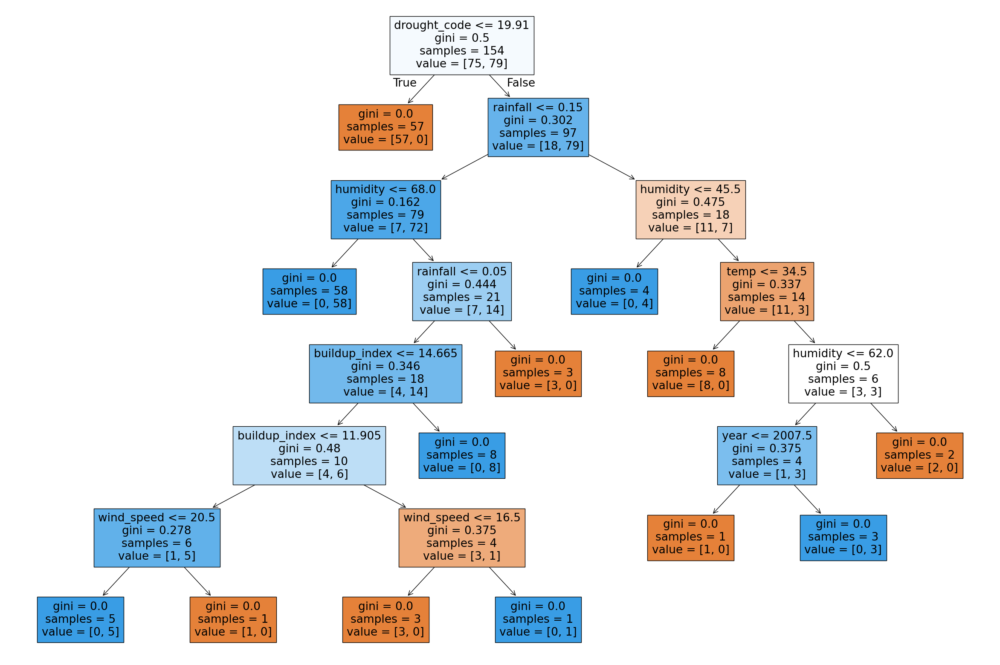

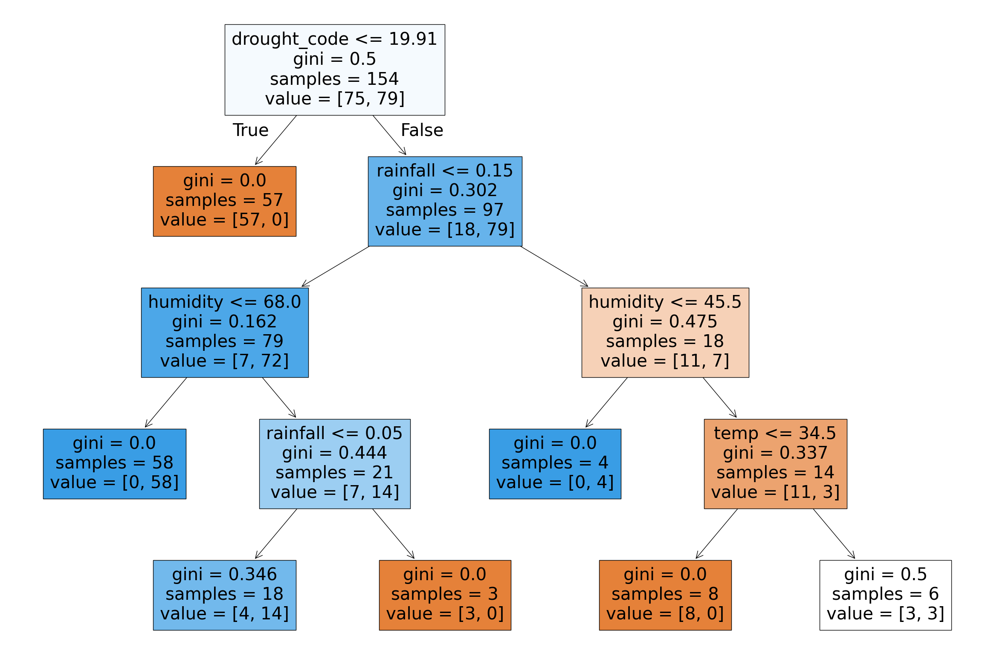

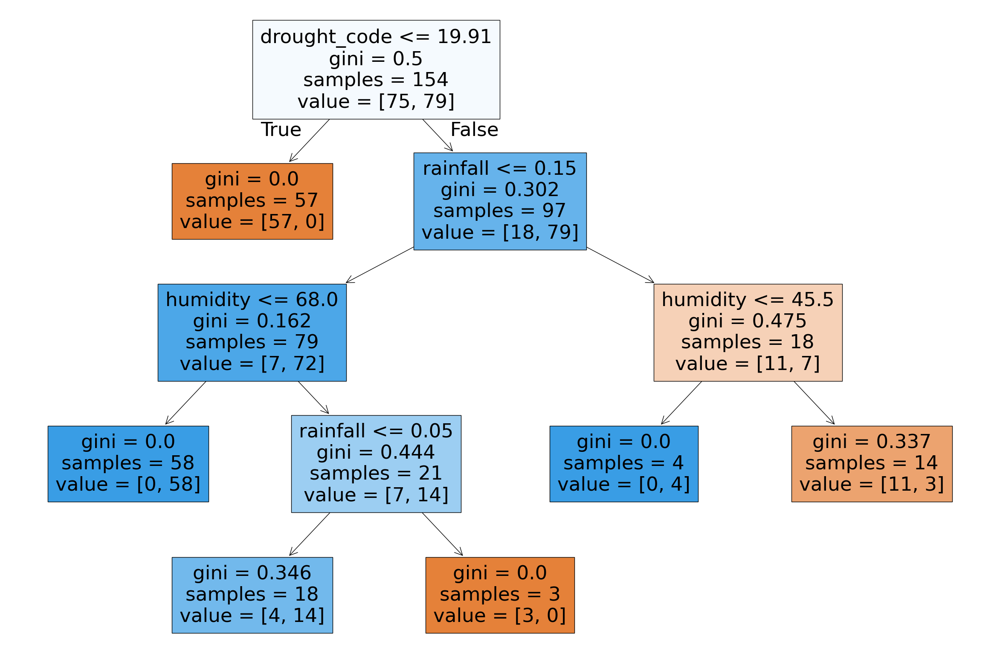

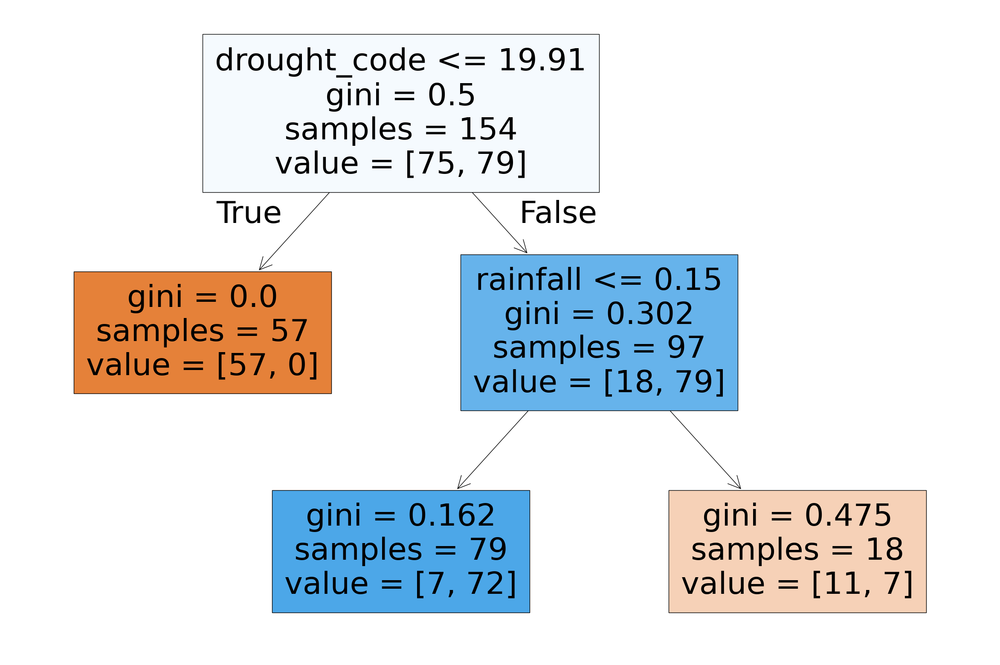

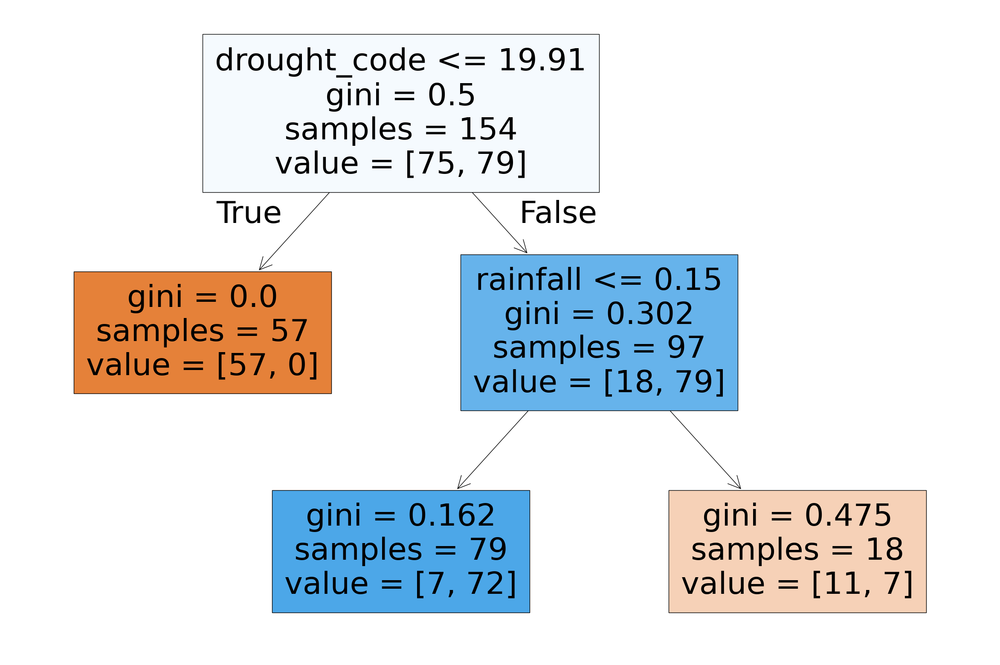

...

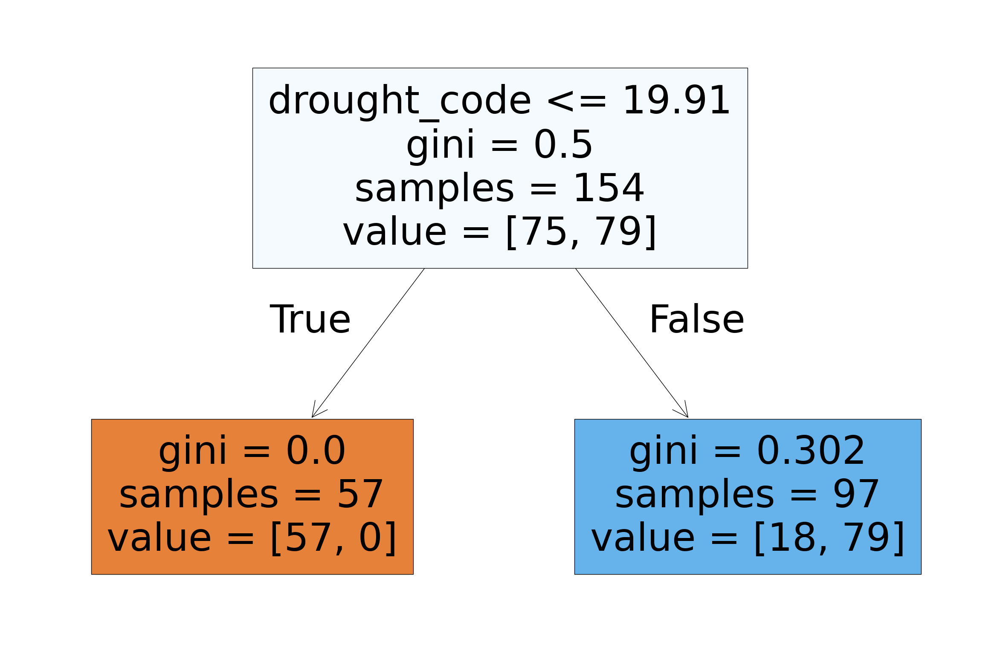

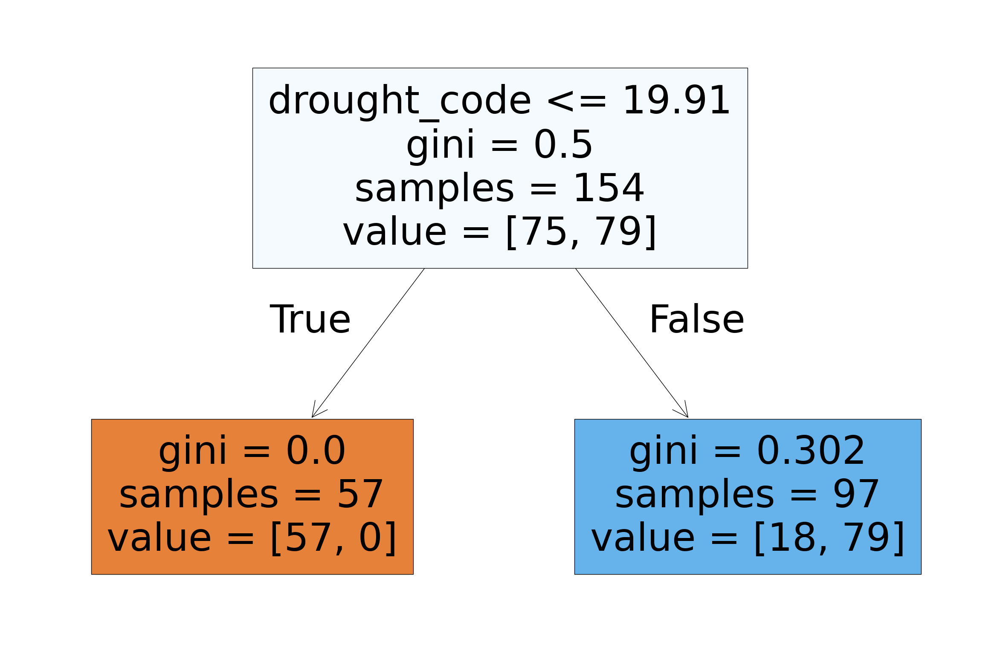

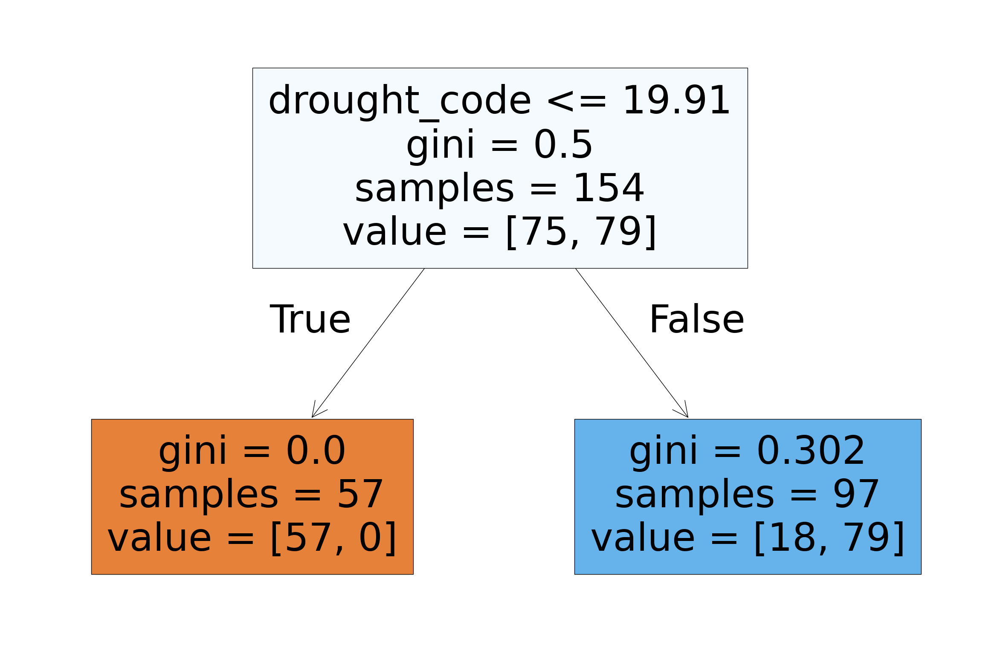

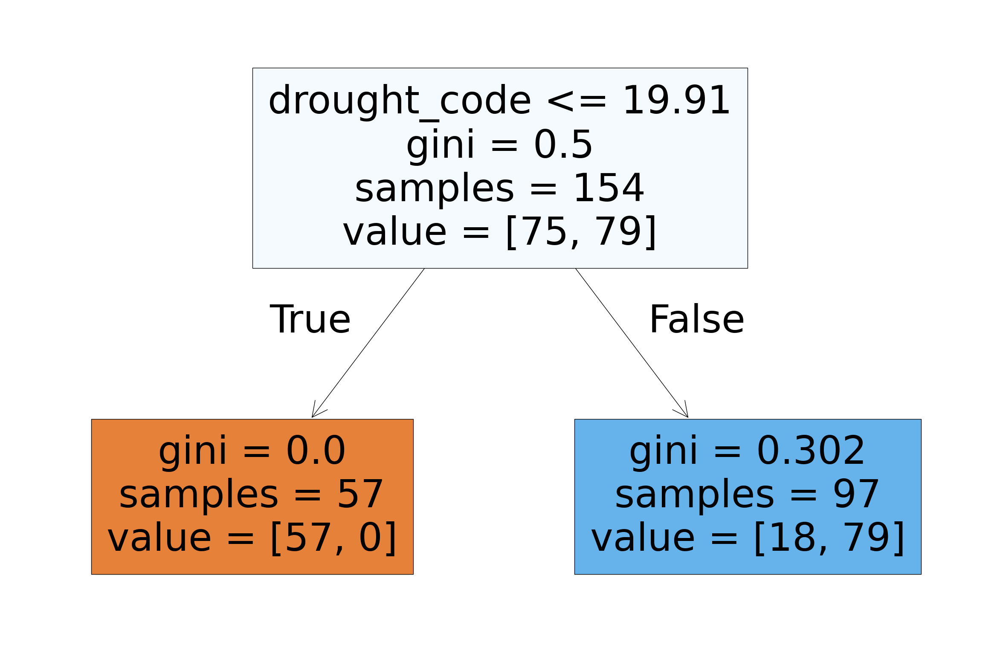

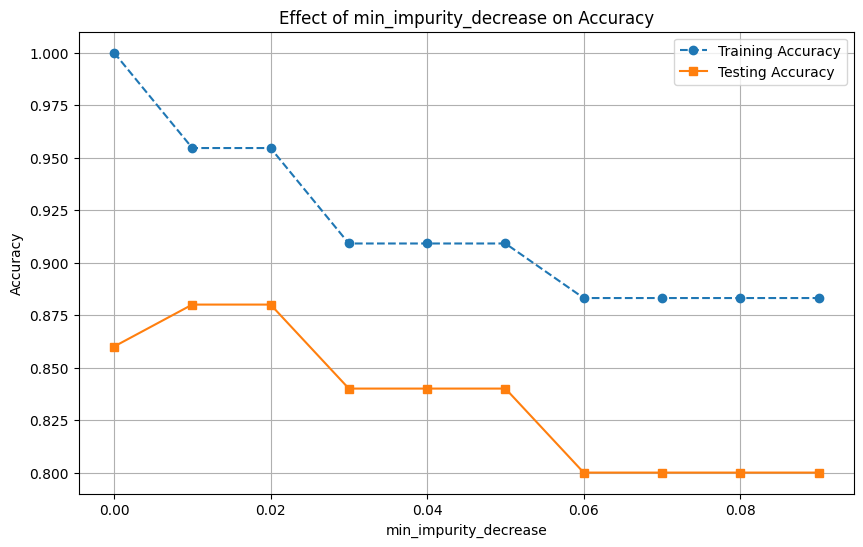

In [112]:
min_impurity_decrease_values = []
train_accuracies = []
test_accuracies = []

# Loop over different min_impurity_decrease values
for i in np.arange(0, 0.10, 0.01):
    model = tree.DecisionTreeClassifier(min_impurity_decrease=i)
    model.fit(x_train, y_train)

    # Predictions
    predictions_train = model.predict(x_train)
    predictions_test = model.predict(x_test)

    # Accuracy scores
    accuracy_train = metrics.accuracy_score(y_train, predictions_train)
    accuracy_test = metrics.accuracy_score(y_test, predictions_test)

    print("Minimum impurity decrease: ", i)
    print("Accuracy on training data: ", accuracy_train)
    print("Accuracy on testing data: ", accuracy_test)

    #append all the accuracies and min_impurity_decrease values to be plotted
    min_impurity_decrease_values.append(i)
    train_accuracies.append(accuracy_train)
    test_accuracies.append(accuracy_test)

    plt.figure(figsize=(30, 20))
    tree.plot_tree(model, filled=True, feature_names=independant_cols)

# Plot the accuracies vs min_impurity_decrease
plt.figure(figsize=(10, 6))
plt.plot(min_impurity_decrease_values, train_accuracies, label='Training Accuracy', marker='o', linestyle='--')
plt.plot(min_impurity_decrease_values, test_accuracies, label='Testing Accuracy', marker='s', linestyle='-')

plt.title('Effect of min_impurity_decrease on Accuracy')
plt.xlabel('min_impurity_decrease')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


## Testing the Second hyperparameter
- Decided to test max depth but it gives us similar results to the min_impurity decrese parameter in the terms that it limits how far down the tree the algorithm can travel. Max_depth does this by directlly limiting the depth of the tree and minimum impurity decrease does this by the level of the tree eventually can't go down any further as it can't eliminate enough randomness in order to go down another layer in the tree. 

- I firstly tested the max_depth parameter by itself and then after this I tested it with both the max_depth parameter and the min_impurity_decrease hyperparameter being iterated and this led to similar results both of them having the same effect essentially achieving the same result with different processes one limiting how deep the tree could progress ajnd the other limiting how much information needed to be gained or randomness decreased to split the data again. 

- Due to it giving us similar results as the max depth hyperparameter I decided to investigate other hyperpparameters that could improve the training and testing performance

Max Depth:  1
Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.8


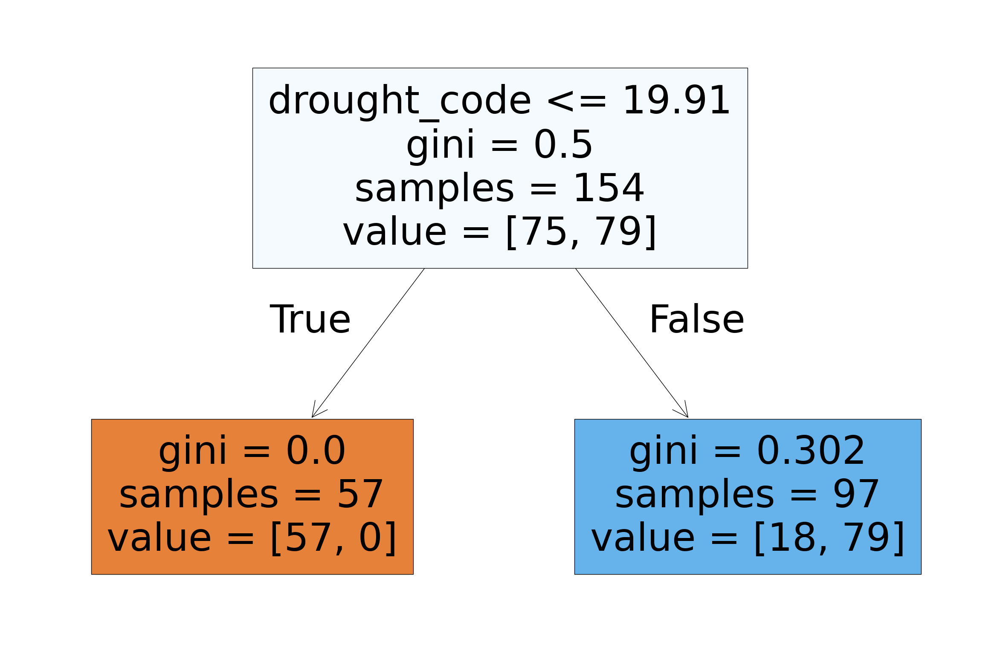

Max Depth:  2
Accuracy on training data:  0.9090909090909091
Accuracy on testing data:  0.84


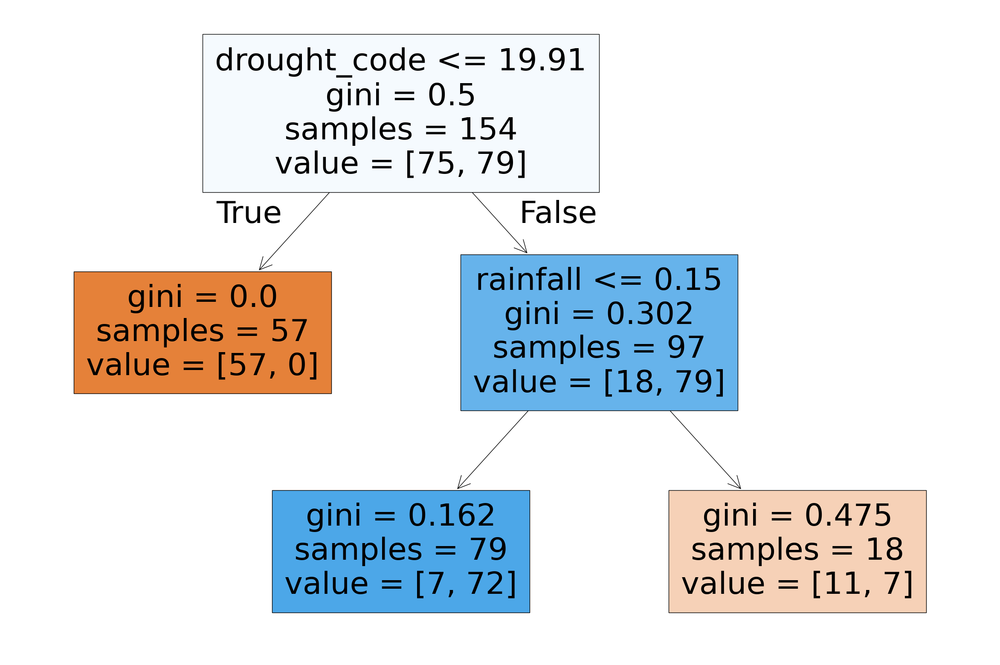

Max Depth:  3
Accuracy on training data:  0.935064935064935
Accuracy on testing data:  0.88


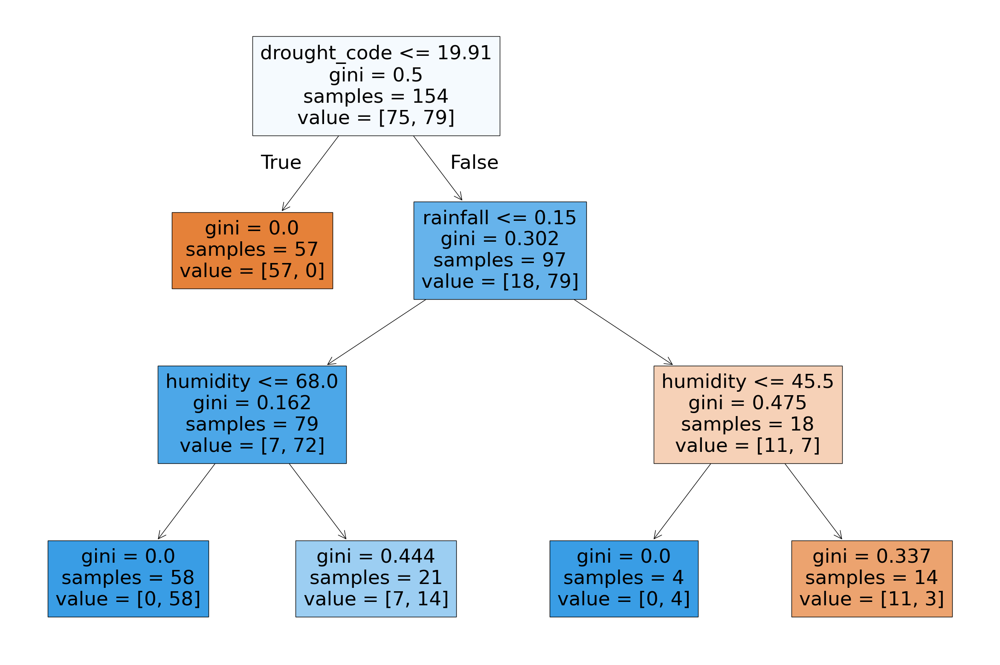

Max Depth:  4
Accuracy on training data:  0.9545454545454546
Accuracy on testing data:  0.88


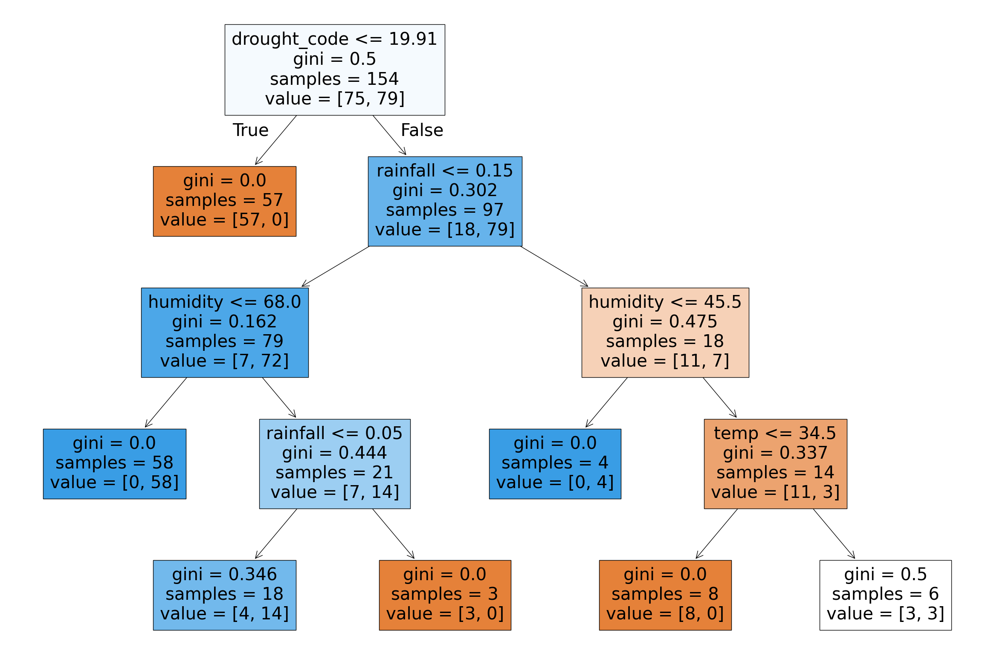

Max Depth:  5
Accuracy on training data:  0.9675324675324676
Accuracy on testing data:  0.86


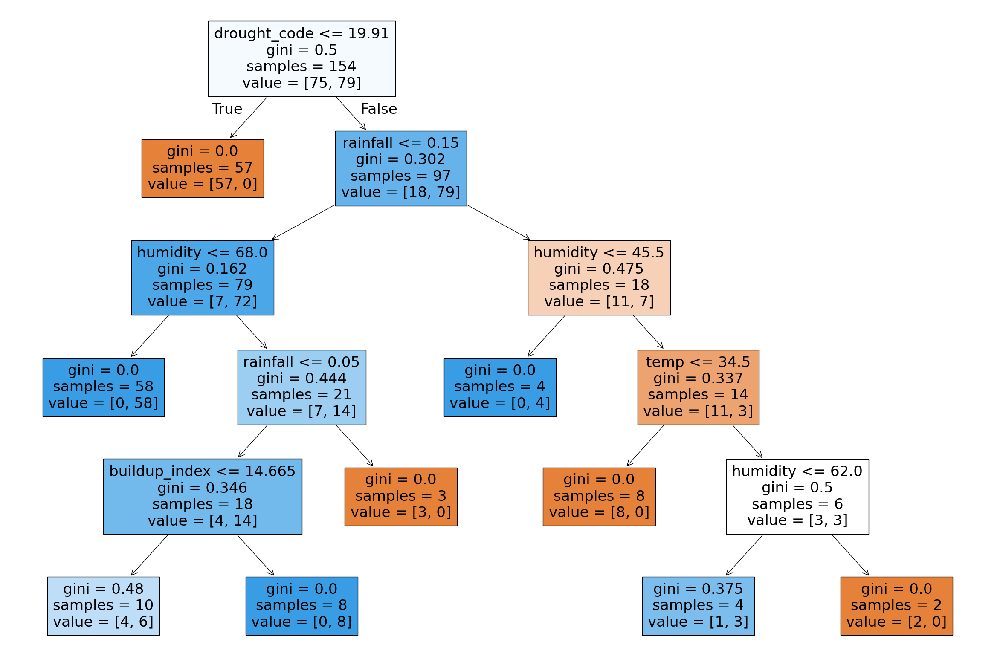

Max Depth:  6
Accuracy on training data:  0.987012987012987
Accuracy on testing data:  0.86


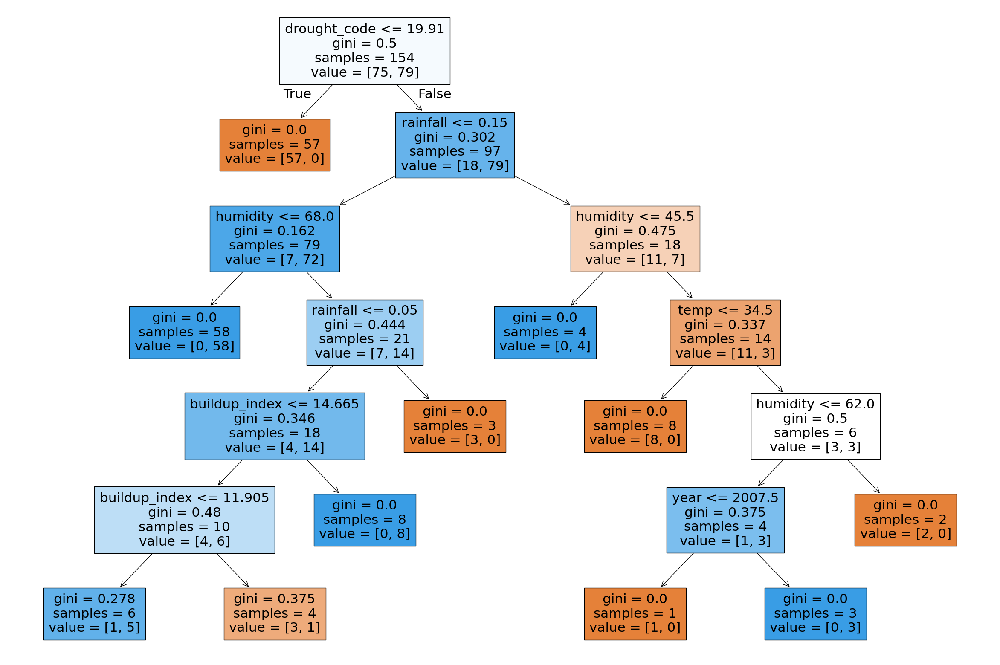

Max Depth:  7
Accuracy on training data:  1.0
Accuracy on testing data:  0.86


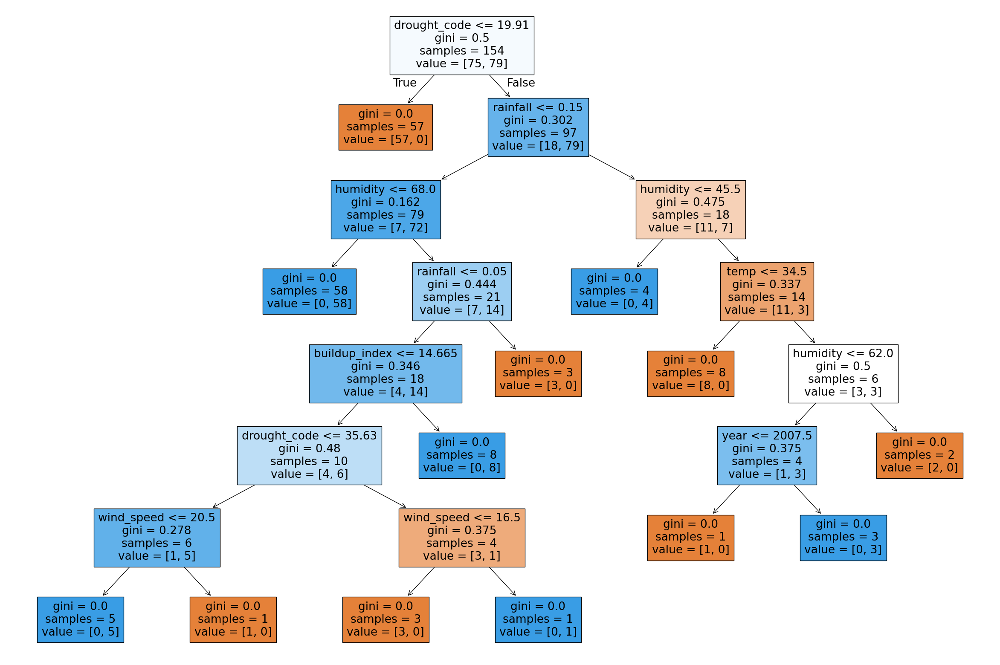

Max Depth:  8
Accuracy on training data:  1.0
Accuracy on testing data:  0.86


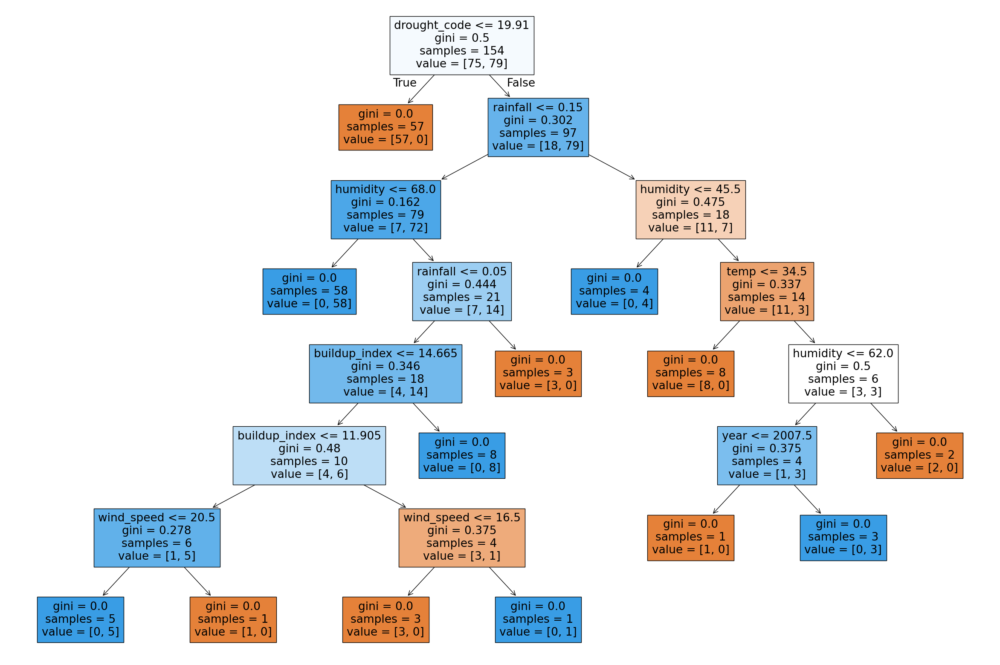

Max Depth:  9
Accuracy on training data:  1.0
Accuracy on testing data:  0.86


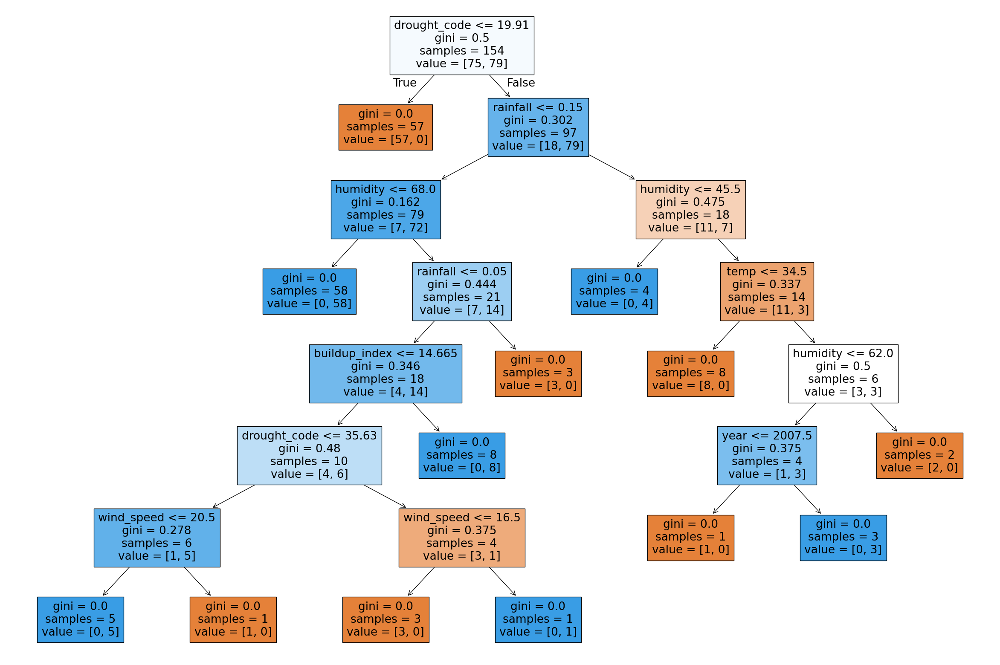

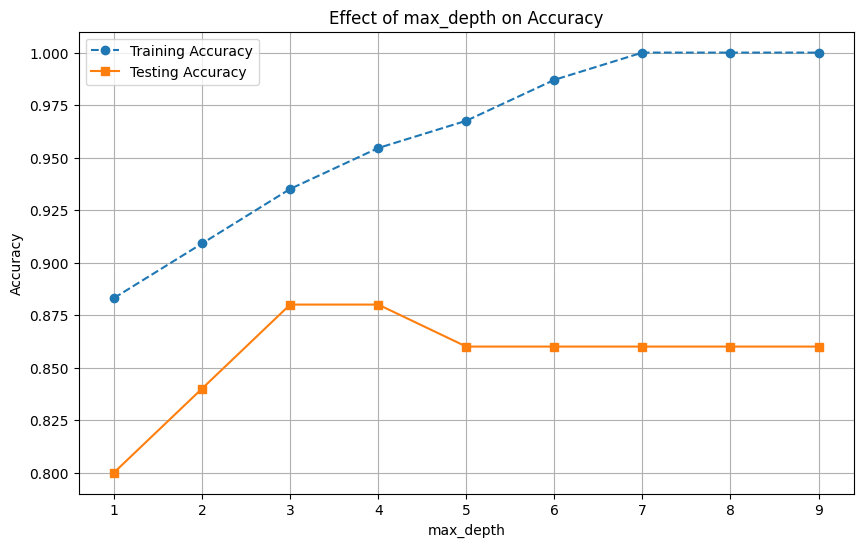

In [113]:
# Lists to store the depth values and their corresponding accuracies
depth_values = []
train_accuracies = []
test_accuracies = []

# Loop over different max_depth values
for i in np.arange(1, 10, 1):
    model = tree.DecisionTreeClassifier(max_depth=i)
    model.fit(x_train, y_train)

    # Predictions
    predictions_train = model.predict(x_train)
    predictions_test = model.predict(x_test)

    # Accuracy scores
    accuracy_train = metrics.accuracy_score(y_train, predictions_train)
    accuracy_test = metrics.accuracy_score(y_test, predictions_test)

    print("Max Depth: ", i)
    print("Accuracy on training data: ", accuracy_train)
    print("Accuracy on testing data: ", accuracy_test)

    # Append values to the lists to eb plotted later
    depth_values.append(i)
    train_accuracies.append(accuracy_train)
    test_accuracies.append(accuracy_test)

    plt.figure(figsize=(30, 20))
    plt.title("Max Depth: " + str(i), fontsize=30)
    tree.plot_tree(model, filled=True, feature_names=independant_cols)
    plt.show()

# Plot the accuracies vs max_depth
plt.figure(figsize=(10, 6))
plt.plot(depth_values, train_accuracies, label='Training Accuracy', marker='o', linestyle='--')
plt.plot(depth_values, test_accuracies, label='Testing Accuracy', marker='s', linestyle='-')

plt.title('Effect of max_depth on Accuracy')
plt.xlabel('max_depth')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


### Third time lucky??? Testing third parameter
- Testing third parameter to see if it will have a better effect on the training and testing data performance. 
- Lets try max leaf nodes which limits the amount of leaf nodes the algorithm can prodeuce it is anpother way to limit the depth of the algoruthm as mathematically you can link the tree depth with the max nuumber of leaf nodes as for example you can't have a tree with 5 leaf nodes with a depth of 5 as the maths of the splitting algorithm would suggest that the max leaf nodes of 2 can only have a tree depth of one etc etc. 

Test Number:  2
Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.8


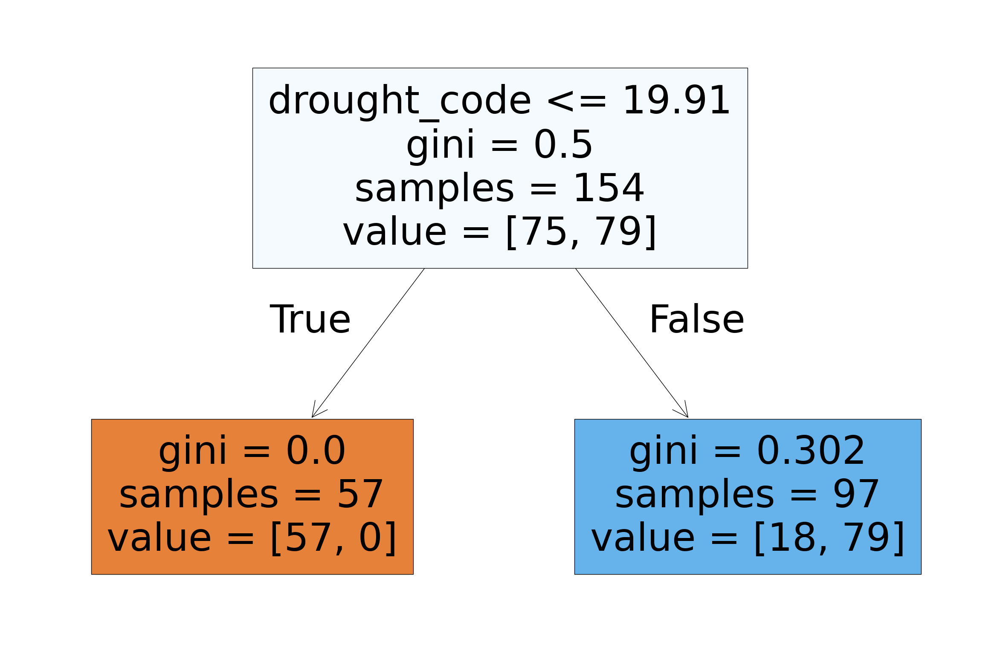

Test Number:  3
Accuracy on training data:  0.9090909090909091
Accuracy on testing data:  0.84


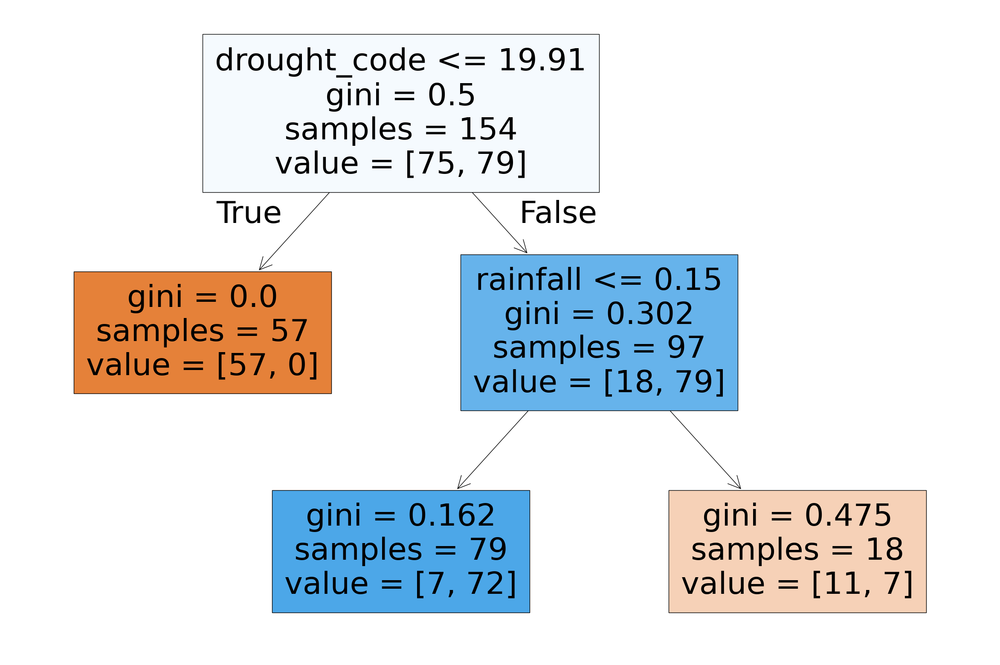

Test Number:  4
Accuracy on training data:  0.935064935064935
Accuracy on testing data:  0.88


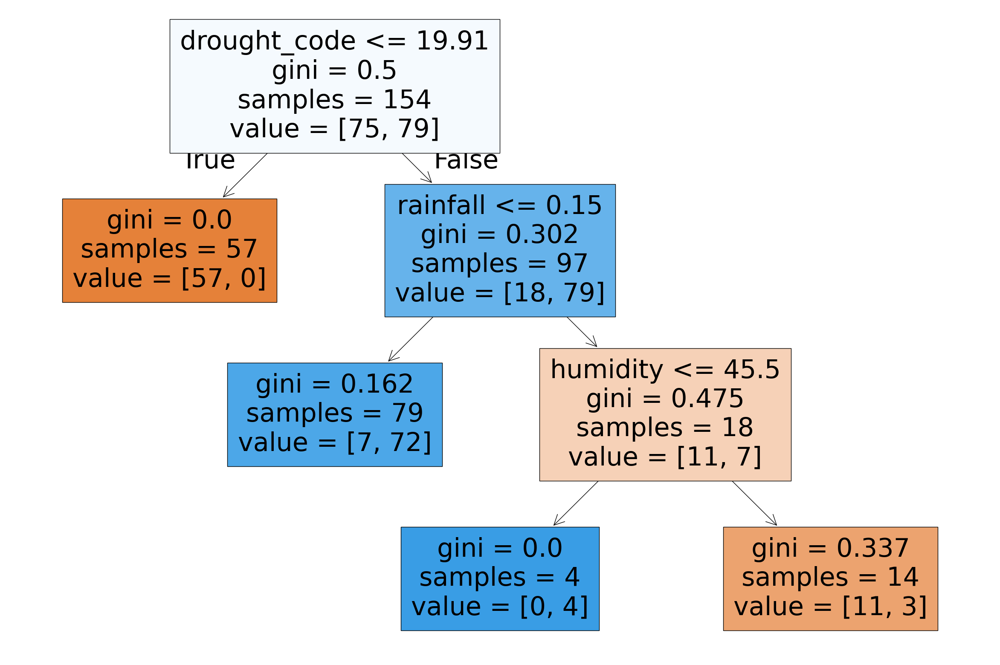

Test Number:  5
Accuracy on training data:  0.935064935064935
Accuracy on testing data:  0.88


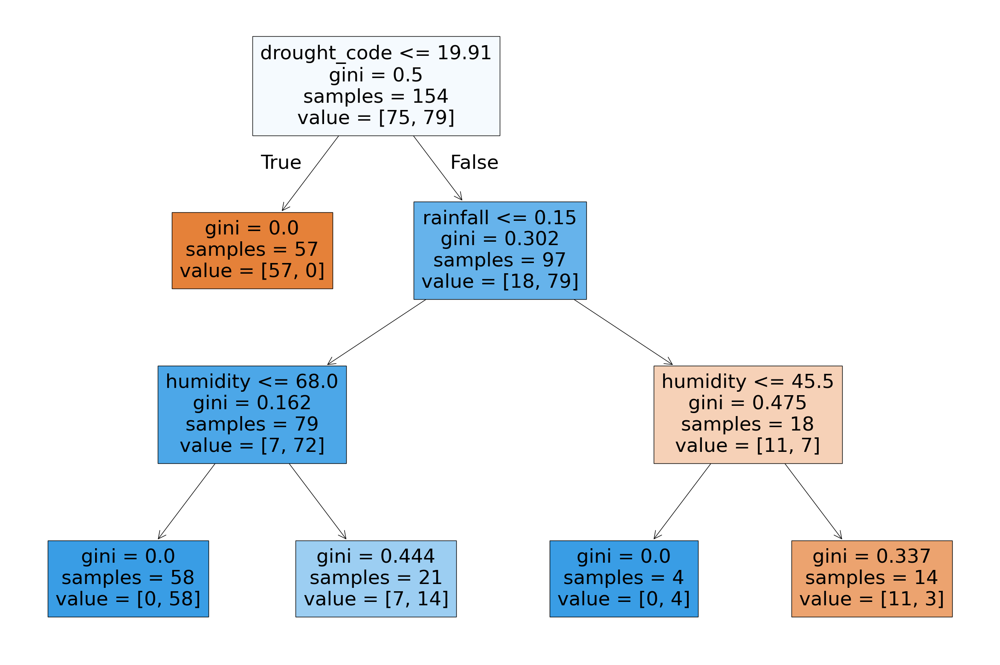

Test Number:  6
Accuracy on training data:  0.9545454545454546
Accuracy on testing data:  0.88


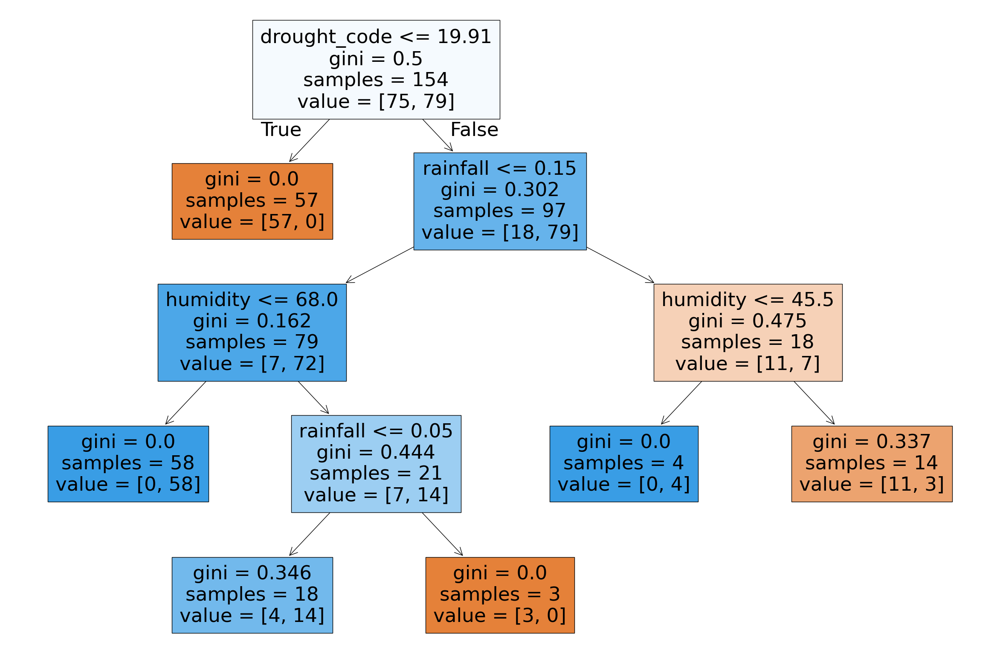

Test Number:  7
Accuracy on training data:  0.9545454545454546
Accuracy on testing data:  0.88


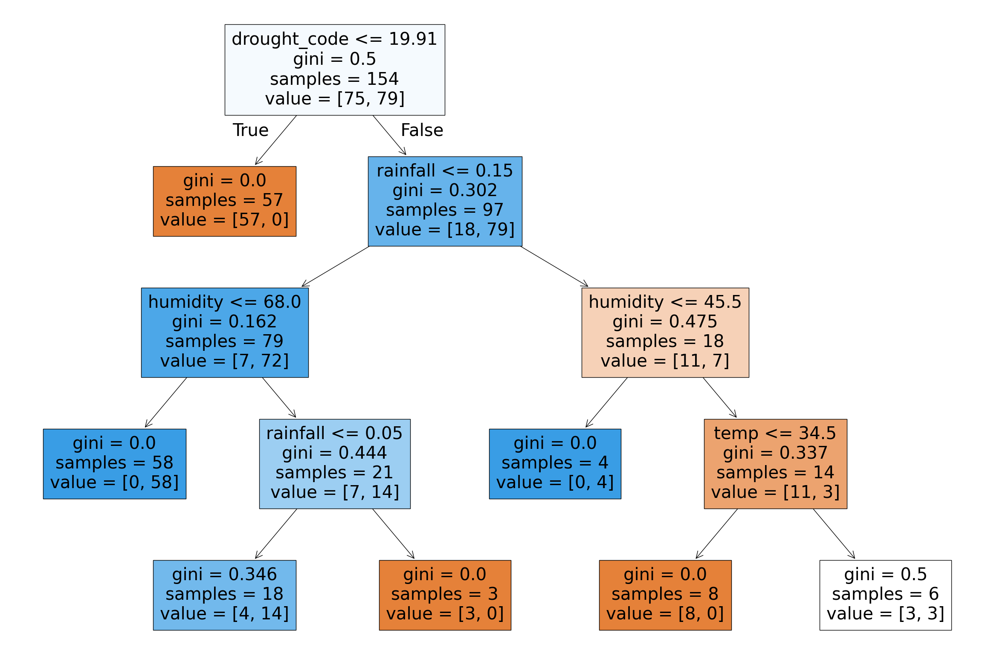

Test Number:  8
Accuracy on training data:  0.9675324675324676
Accuracy on testing data:  0.86


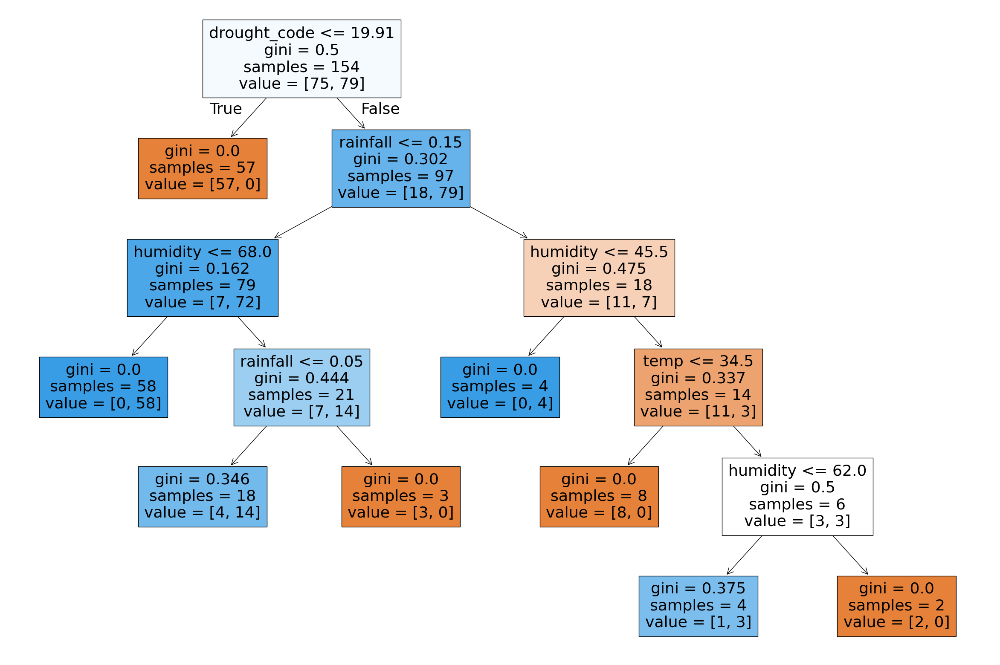

Test Number:  9
Accuracy on training data:  0.974025974025974
Accuracy on testing data:  0.86


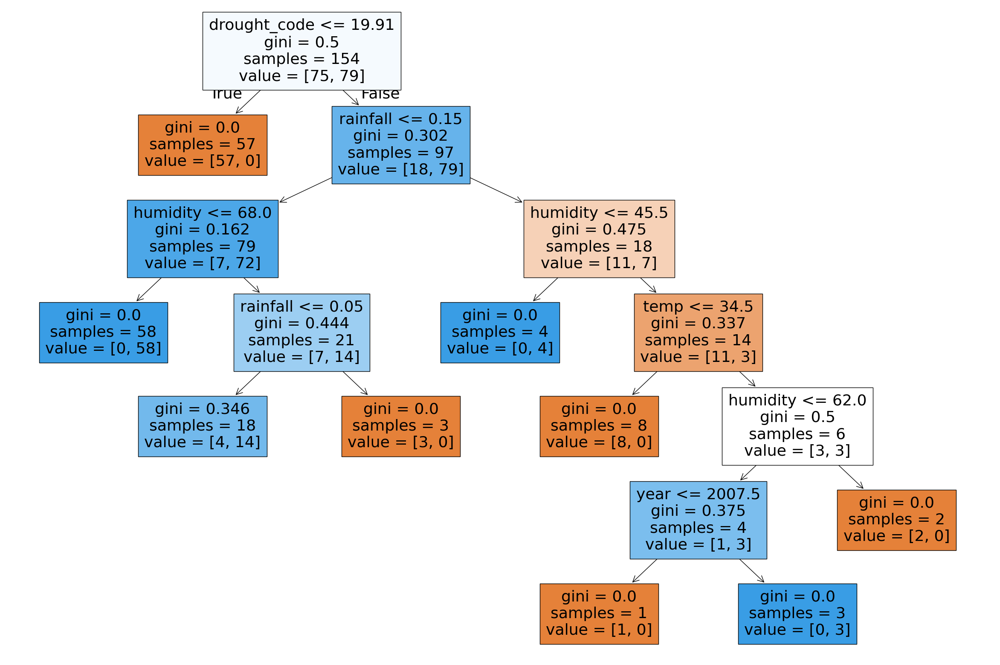

In [114]:
%matplotlib inline
#min_impurity_decrease = 0.01
for i in np.arange(2, 10, 1):
    model = tree.DecisionTreeClassifier(max_leaf_nodes=i)
    model.fit(x_train, y_train)

    predictions_train = model.predict(x_train)
    predictions_test = model.predict(x_test)

    accuracy_train = metrics.accuracy_score(y_train, predictions_train)
    accuracy_test = metrics.accuracy_score(y_test, predictions_test)
    print("Test Number: ", i)
    print("Accuracy on training data: ", accuracy_train)
    print("Accuracy on testing data: ", accuracy_test)

   
    plt.figure(figsize=(30,20))
    plt.title( "Test Number: " + str(i), fontsize=30)
    tree.plot_tree(model, filled=True, feature_names=independant_cols)
    plt.show()
    #min_impurity_decrease += 0.01

## Testing Gaussian Process Classification training performance   
- Read in datasets seperating the raw data and labels.   
- Train data using the differnt kernel types.   
- Check the model performance using the training accuracy with training and test dataset.   

In [132]:
kernel = 1.0 * RBF(1.0)
model = GaussianProcessClassifier(kernel=kernel, random_state=0).fit(x_train, y_train)

gaussian_predictions_train = model.predict(x_train)
gaussian_predictions_test = model.predict(x_test)

gaussian_accuracy_train = metrics.accuracy_score(y_train, gaussian_predictions_train)
gaussian_accuracy_test = metrics.accuracy_score(y_test, gaussian_predictions_test)
print("Accuracy on training data: ", gaussian_accuracy_train)
print("Accuracy on testing data: ", gaussian_accuracy_test)

score = model.score(x_train, y_train)
print("Score: ", score)



Accuracy on training data:  0.9025974025974026
Accuracy on testing data:  0.8
Score:  0.9025974025974026


### Start changing the hyper parameters of the algorithm 
- Now that we have a functioning algorithm we can start ot adjust hyperparameters and see its effect on training performance and its predictions wiht the testing dataset also.
- First hyper parameter we are going to adjust is the kernel that we will be using the sciket learn package provides multiple different kernels so we will iterate theough numerous of these kernels and see how theyt effect the dataset.

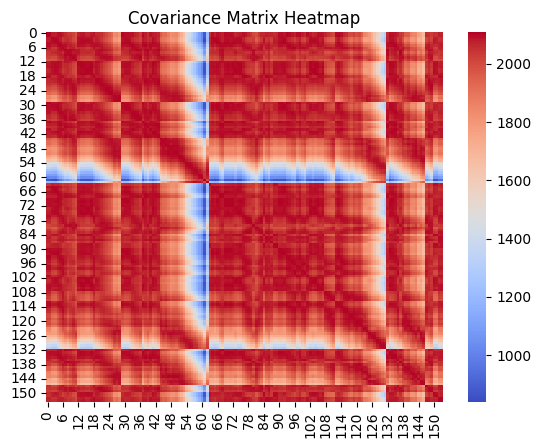

Accuracy on training data:  0.9025974025974026
Accuracy on testing data:  0.8
Precision on training data:  0.9
Precision on testing data:  0.95
Recall on training data:  0.9113924050632911
Recall on testing data:  0.6785714285714286
F1 Score on training data:  0.9056603773584906
F1 Score on testing data:  0.7916666666666666
Score:  0.9025974025974026


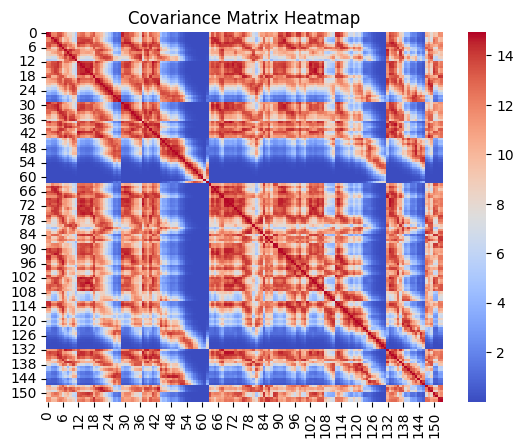

Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.82
Precision on training data:  0.8674698795180723
Precision on testing data:  0.88
Recall on training data:  0.9113924050632911
Recall on testing data:  0.7857142857142857
F1 Score on training data:  0.8888888888888888
F1 Score on testing data:  0.8301886792452831
Score:  0.8831168831168831


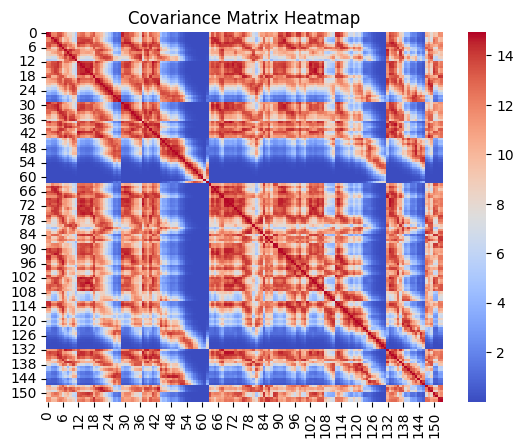

Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.82
Precision on training data:  0.8674698795180723
Precision on testing data:  0.88
Recall on training data:  0.9113924050632911
Recall on testing data:  0.7857142857142857
F1 Score on training data:  0.8888888888888888
F1 Score on testing data:  0.8301886792452831
Score:  0.8831168831168831


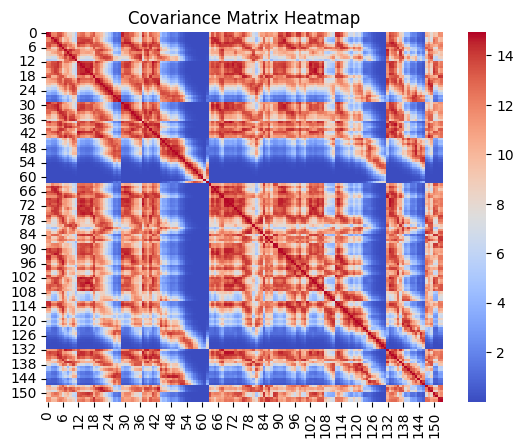

Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.82
Precision on training data:  0.8674698795180723
Precision on testing data:  0.88
Recall on training data:  0.9113924050632911
Recall on testing data:  0.7857142857142857
F1 Score on training data:  0.8888888888888888
F1 Score on testing data:  0.8301886792452831
Score:  0.8831168831168831


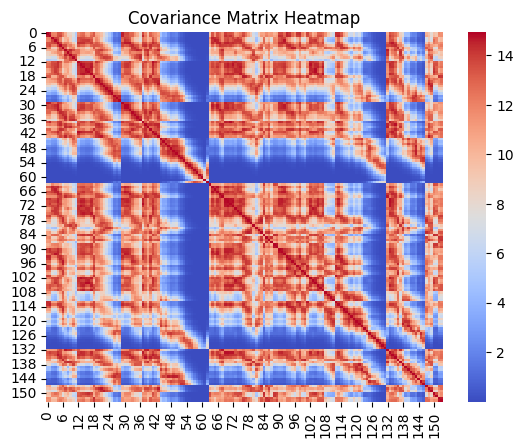

Accuracy on training data:  0.8831168831168831
Accuracy on testing data:  0.82
Precision on training data:  0.8674698795180723
Precision on testing data:  0.88
Recall on training data:  0.9113924050632911
Recall on testing data:  0.7857142857142857
F1 Score on training data:  0.8888888888888888
F1 Score on testing data:  0.8301886792452831
Score:  0.8831168831168831


c:\Users\Patrick\Documents\MachineLearningAssignment1\mlenv\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


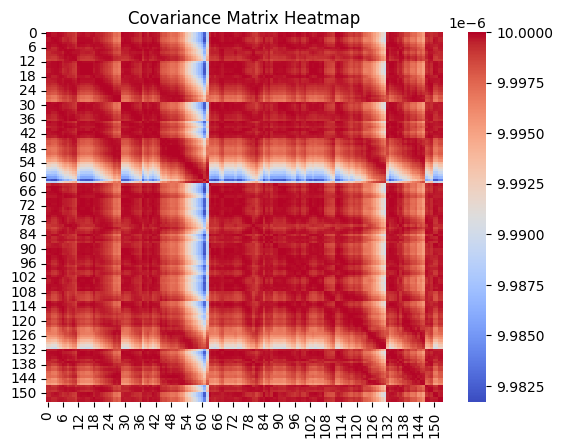

Accuracy on training data:  0.512987012987013
Accuracy on testing data:  0.56
Precision on training data:  0.512987012987013
Precision on testing data:  0.56
Recall on training data:  1.0
Recall on testing data:  1.0
F1 Score on training data:  0.6781115879828327
F1 Score on testing data:  0.717948717948718
Score:  0.512987012987013


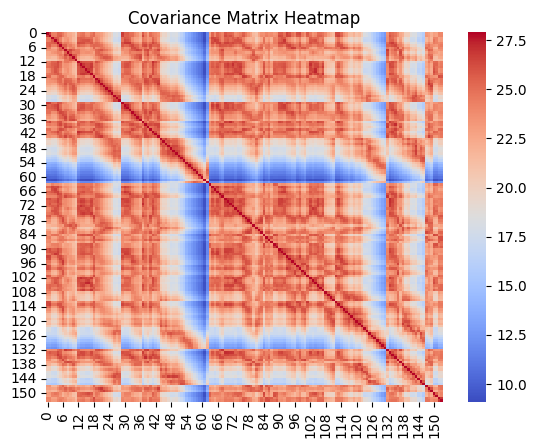

Accuracy on training data:  0.9285714285714286
Accuracy on testing data:  0.8
Precision on training data:  0.9146341463414634
Precision on testing data:  0.8461538461538461
Recall on training data:  0.9493670886075949
Recall on testing data:  0.7857142857142857
F1 Score on training data:  0.9316770186335404
F1 Score on testing data:  0.8148148148148148
Score:  0.9285714285714286


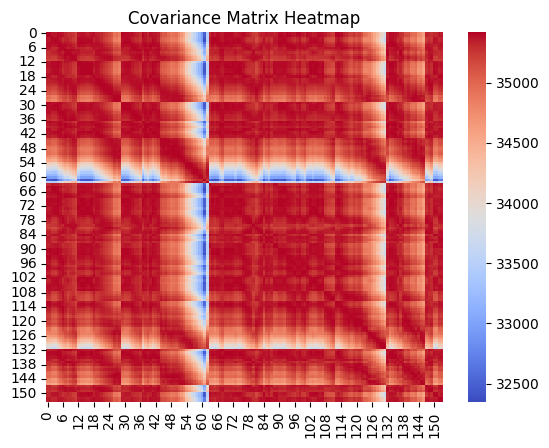

Accuracy on training data:  0.9090909090909091
Accuracy on testing data:  0.8
Precision on training data:  0.9012345679012346
Precision on testing data:  0.95
Recall on training data:  0.9240506329113924
Recall on testing data:  0.6785714285714286
F1 Score on training data:  0.9125
F1 Score on testing data:  0.7916666666666666
Score:  0.9090909090909091


In [116]:
kernels = [
    1.0 * RBF(1.0),
    1.0 * RBF(2.0),
    1.0 * RBF(3.0),
    1.0 * RBF(4.0),
    1.0 * RBF(5.0),
    1.0 * Matern(length_scale=1.0, nu=1.5),
    1.0 * Matern(length_scale=1.0, nu=.5),
    1.0 * Matern(length_scale=1.0, nu=2.5),
]

results = []  # Array to store the results of each iteration

for kernel in kernels:
    # Create and fit the model
    model = GaussianProcessClassifier(kernel=kernel, random_state=0).fit(x_train, y_train)

    # Make predictions
    gaussian_predictions_train = model.predict(x_train)
    gaussian_predictions_test = model.predict(x_test)

    # Compute covariance matrix using fitted kernel
    K = model.kernel_(x_train)
    
    # Plot the covariance matrix heatmap
    sns.heatmap(K, cmap="coolwarm")
    plt.title("Covariance Matrix Heatmap")
    plt.show()
    
    # Calculate accuracy
    gaussian_accuracy_train = accuracy_score(y_train, gaussian_predictions_train)
    gaussian_accuracy_test = accuracy_score(y_test, gaussian_predictions_test)
    
    # Calculate precision, recall, and F1 score
    precision_train = precision_score(y_train, gaussian_predictions_train, pos_label='yes')
    precision_test = precision_score(y_test, gaussian_predictions_test, pos_label='yes')
    recall_train = recall_score(y_train, gaussian_predictions_train, pos_label='yes')
    recall_test = recall_score(y_test, gaussian_predictions_test, pos_label='yes')
    f1_train = f1_score(y_train, gaussian_predictions_train, pos_label='yes')
    f1_test = f1_score(y_test, gaussian_predictions_test, pos_label='yes')

    # Print metrics
    print("Accuracy on training data: ", gaussian_accuracy_train)
    print("Accuracy on testing data: ", gaussian_accuracy_test)
    print("Precision on training data: ", precision_train)
    print("Precision on testing data: ", precision_test)
    print("Recall on training data: ", recall_train)
    print("Recall on testing data: ", recall_test)
    print("F1 Score on training data: ", f1_train)
    print("F1 Score on testing data: ", f1_test)

    # Get the model score
    score = model.score(x_train, y_train)
    print("Score: ", score)

    # Store results
    results.append({
        "Kernel": kernel,
        "Accuracy on training data": gaussian_accuracy_train,
        "Accuracy on testing data": gaussian_accuracy_test,
        "Precision on training data": precision_train,
        "Precision on testing data": precision_test,
        "Recall on training data": recall_train,
        "Recall on testing data": recall_test,
        "F1 Score on training data": f1_train,
        "F1 Score on testing data": f1_test,
        "Score": score
    })


Length Scale: 0.01, Train Accuracy: 1.0000, Test Accuracy: 0.4400
Length Scale: 0.03, Train Accuracy: 1.0000, Test Accuracy: 0.4400
Length Scale: 0.08, Train Accuracy: 1.0000, Test Accuracy: 0.4400
Length Scale: 0.22, Train Accuracy: 1.0000, Test Accuracy: 0.4400
Length Scale: 0.60, Train Accuracy: 1.0000, Test Accuracy: 0.8200
Length Scale: 1.67, Train Accuracy: 0.8831, Test Accuracy: 0.8200
Length Scale: 4.64, Train Accuracy: 0.8831, Test Accuracy: 0.8200
Length Scale: 12.92, Train Accuracy: 0.8831, Test Accuracy: 0.8200
Length Scale: 35.94, Train Accuracy: 0.8831, Test Accuracy: 0.8200
Length Scale: 100.00, Train Accuracy: 0.8831, Test Accuracy: 0.8200


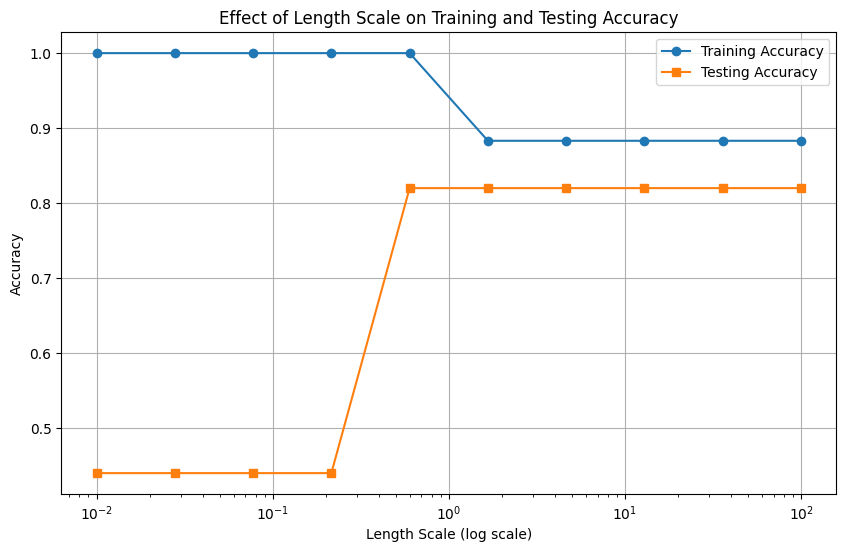

In [136]:
train_accuracies = []
test_accuracies = []

length_scales = np.logspace(-2, 2, 10)  # Length scale from 0.01 to 100 in logarithmic steps

for length_scale in length_scales:
  
    kernel = 1.0 * RBF(length_scale=length_scale)
    
    gpc = GaussianProcessClassifier(kernel=kernel, random_state=42)
    
    gpc.fit(x_train, y_train)
    
    y_train_pred = gpc.predict(x_train)
    y_test_pred = gpc.predict(x_test)
    
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)
    
    print(f"Length Scale: {length_scale:.2f}, Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(length_scales, train_accuracies, label='Training Accuracy', marker='o')
plt.plot(length_scales, test_accuracies, label='Testing Accuracy', marker='s')

plt.xscale('log')
plt.xlabel('Length Scale (log scale)')
plt.ylabel('Accuracy')
plt.title('Effect of Length Scale on Training and Testing Accuracy')
plt.legend()
plt.grid(True)
plt.show()


Kernel: RBF, Train Accuracy: 0.9026, Test Accuracy: 0.8000
Kernel: Matern, Train Accuracy: 0.5130, Test Accuracy: 0.5600


c:\Users\Patrick\Documents\MachineLearningAssignment1\mlenv\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Kernel: RationalQuadratic, Train Accuracy: 0.8766, Test Accuracy: 0.8200
Kernel: DotProduct, Train Accuracy: 0.8766, Test Accuracy: 0.8200


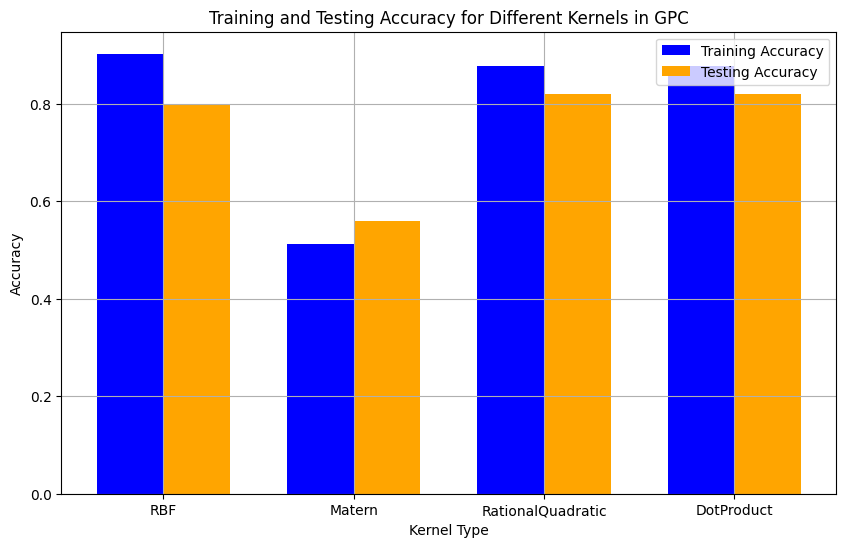

In [155]:
kernels = [
    1.0 * RBF(length_scale=1.0),                
    1.0 * Matern(length_scale=1.0, nu=1.5),      
    1.0 * RationalQuadratic(length_scale=1.0, alpha=1.0), 
    1.0 * DotProduct()                          
]

train_accuracies = []
test_accuracies = []
kernel_names = ['RBF', 'Matern', 'RationalQuadratic', 'DotProduct']

for kernel, kernel_name in zip(kernels, kernel_names):
    gpc = GaussianProcessClassifier(kernel=kernel, random_state=42)
    
    gpc.fit(x_train, y_train)
    
    y_train_pred = gpc.predict(x_train)
    y_test_pred = gpc.predict(x_test)
    
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)
    
    print(f"Kernel: {kernel_name}, Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}")

plt.figure(figsize=(10, 6))

index = np.arange(len(kernel_names))
bar_width = 0.35

plt.bar(index, train_accuracies, bar_width, label='Training Accuracy', color='blue')

plt.bar(index + bar_width, test_accuracies, bar_width, label='Testing Accuracy', color='orange')

plt.xlabel('Kernel Type')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracy for Different Kernels in GPC')
plt.xticks(index + bar_width / 2, kernel_names)
plt.legend()

plt.grid(True)
plt.show()


Length Scale: 0.01
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.4400
Length Scale: 0.03
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.5600
Length Scale: 0.08
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.8200
Length Scale: 0.22
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.8200
Length Scale: 0.60
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 0.9091, Test Accuracy: 0.8200
Length Scale: 1.67
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 0.9091, Test Accuracy: 0.8200
Length Scale: 4.64
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 0.9091, Test Ac

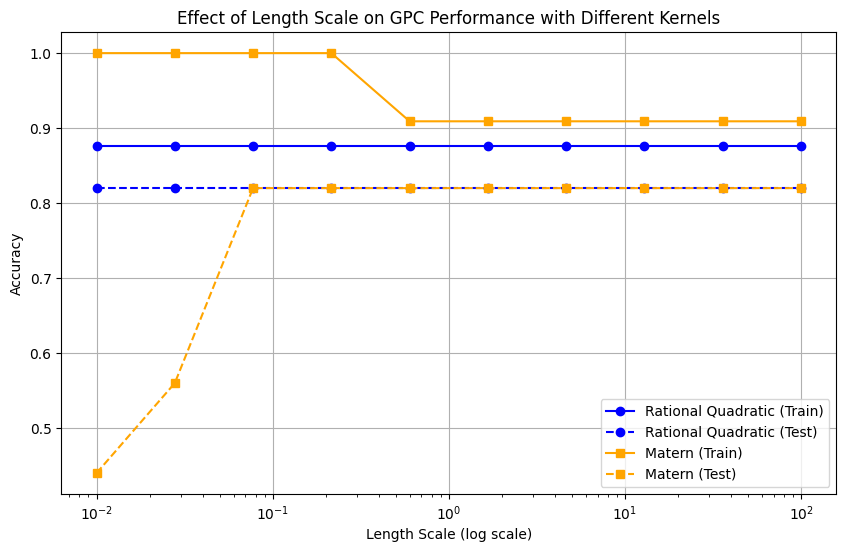

In [152]:
train_accuracies = []
test_accuracies = []
kernel_names = []

length_scales = np.logspace(-2, 2, 10) # Length scales from log(0.01) to log(100)

for length_scale in length_scales:
    
    rq_kernel = 1.0 * RationalQuadratic(length_scale=length_scale, alpha=1.0) ##Rational Quadratic Kernel
    gpc_rq = GaussianProcessClassifier(kernel=rq_kernel, random_state=42)  #
    
    matern_kernel = 1.0 * Matern(length_scale=length_scale, nu=1.5) ##Matern Kernel
    gpc_matern = GaussianProcessClassifier(kernel=matern_kernel, random_state=42)
    
    #get the  performance accuracy of the model on the training and testing data for quadratic  kernels
    gpc_rq.fit(x_train, y_train)
    y_train_pred_rq = gpc_rq.predict(x_train)
    y_test_pred_rq = gpc_rq.predict(x_test)
    train_acc_rq = accuracy_score(y_train, y_train_pred_rq)
    test_acc_rq = accuracy_score(y_test, y_test_pred_rq)
    
    #get the  performance accuracy of the model on the training and testing data for quadratic  kernels
    gpc_matern.fit(x_train, y_train)
    y_train_pred_matern = gpc_matern.predict(x_train)
    y_test_pred_matern = gpc_matern.predict(x_test)
    train_acc_matern = accuracy_score(y_train, y_train_pred_matern)
    test_acc_matern = accuracy_score(y_test, y_test_pred_matern)
    
    #append all the results so that they can be plotted later
    train_accuracies.append((train_acc_rq, train_acc_matern))
    test_accuracies.append((test_acc_rq, test_acc_matern))
    kernel_names.append(f'Length Scale: {length_scale:.2f}')

    print(f"Length Scale: {length_scale:.2f}")
    print(f"  Rational Quadratic - Train Accuracy: {train_acc_rq:.4f}, Test Accuracy: {test_acc_rq:.4f}")
    print(f"  Matern - Train Accuracy: {train_acc_matern:.4f}, Test Accuracy: {test_acc_matern:.4f}")

#unzip results into their desired groups so they can be plotted aghainst each other 
train_accuracies_rq, train_accuracies_matern = zip(*train_accuracies)
test_accuracies_rq, test_accuracies_matern = zip(*test_accuracies)

#plot the results against each other
plt.figure(figsize=(10, 6))

plt.plot(length_scales, train_accuracies_rq, label='Rational Quadratic (Train)', marker='o', color='blue')
plt.plot(length_scales, test_accuracies_rq, label='Rational Quadratic (Test)', marker='o', linestyle='--', color='blue')

plt.plot(length_scales, train_accuracies_matern, label='Matern (Train)', marker='s', color='orange')
plt.plot(length_scales, test_accuracies_matern, label='Matern (Test)', marker='s', linestyle='--', color='orange')

plt.xscale('log')
plt.xlabel('Length Scale (log scale)')
plt.ylabel('Accuracy')
plt.title('Effect of Length Scale on GPC Performance with Different Kernels')
plt.legend()
plt.grid(True)
plt.show()


### Below carries out the same as code snippet above but adds in more kernels to test essentially.


Length Scale: 0.01
  RBF - Train Accuracy: 1.0000, Test Accuracy: 0.4400
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.4400
  Dot Product - Train Accuracy: 0.8766, Test Accuracy: 0.8200
Length Scale: 0.03
  RBF - Train Accuracy: 1.0000, Test Accuracy: 0.4400
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.5600
  Dot Product - Train Accuracy: 0.8766, Test Accuracy: 0.8200
Length Scale: 0.08
  RBF - Train Accuracy: 1.0000, Test Accuracy: 0.4400
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.8200
  Dot Product - Train Accuracy: 0.8766, Test Accuracy: 0.8200
Length Scale: 0.22
  RBF - Train Accuracy: 1.0000, Test Accuracy: 0.4400
  Rational Quadratic - Train Accuracy: 0.8766, Test Accuracy: 0.8200
  Matern - Train Accuracy: 1.0000, Test Accuracy: 0.8200
  Dot Product - Tr

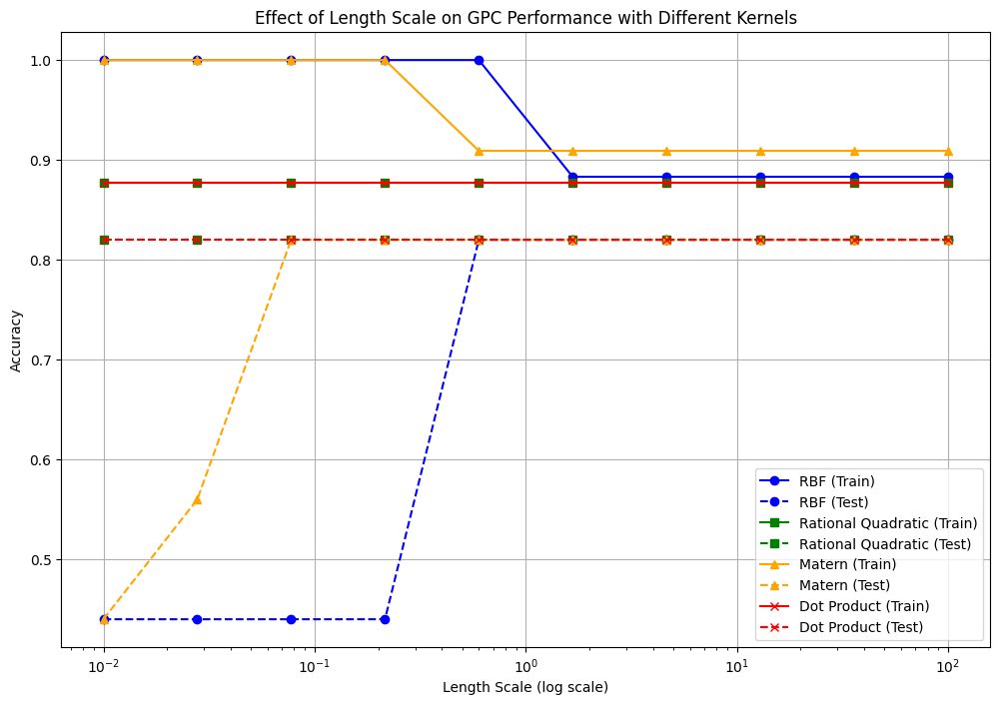

In [145]:
train_accuracies = []
test_accuracies = []
kernel_names = []

length_scales = np.logspace(-2, 2, 10)

for length_scale in length_scales:
    
    rbf_kernel = 1.0 * RBF(length_scale=length_scale)
    gpc_rbf = GaussianProcessClassifier(kernel=rbf_kernel, random_state=42)
    
    rq_kernel = 1.0 * RationalQuadratic(length_scale=length_scale, alpha=1.0)
    gpc_rq = GaussianProcessClassifier(kernel=rq_kernel, random_state=42)
    
    matern_kernel = 1.0 * Matern(length_scale=length_scale, nu=1.5)
    gpc_matern = GaussianProcessClassifier(kernel=matern_kernel, random_state=42)
    
    dot_product_kernel = 1.0 * DotProduct(sigma_0=length_scale)
    gpc_dot = GaussianProcessClassifier(kernel=dot_product_kernel, random_state=42)
    
    #Train all the algorithms that use the different kernels and then append them into the differnt arrays to be plotted later
    gpc_rbf.fit(x_train, y_train)
    y_train_pred_rbf = gpc_rbf.predict(x_train)
    y_test_pred_rbf = gpc_rbf.predict(x_test)
    train_acc_rbf = accuracy_score(y_train, y_train_pred_rbf)
    test_acc_rbf = accuracy_score(y_test, y_test_pred_rbf)
    
    gpc_rq.fit(x_train, y_train)
    y_train_pred_rq = gpc_rq.predict(x_train)
    y_test_pred_rq = gpc_rq.predict(x_test)
    train_acc_rq = accuracy_score(y_train, y_train_pred_rq)
    test_acc_rq = accuracy_score(y_test, y_test_pred_rq)
    
    gpc_matern.fit(x_train, y_train)
    y_train_pred_matern = gpc_matern.predict(x_train)
    y_test_pred_matern = gpc_matern.predict(x_test)
    train_acc_matern = accuracy_score(y_train, y_train_pred_matern)
    test_acc_matern = accuracy_score(y_test, y_test_pred_matern)
    
    gpc_dot.fit(x_train, y_train)
    y_train_pred_dot = gpc_dot.predict(x_train)
    y_test_pred_dot = gpc_dot.predict(x_test)
    train_acc_dot = accuracy_score(y_train, y_train_pred_dot)
    test_acc_dot = accuracy_score(y_test, y_test_pred_dot)
    
    train_accuracies.append((train_acc_rbf, train_acc_rq, train_acc_matern, train_acc_dot))
    test_accuracies.append((test_acc_rbf, test_acc_rq, test_acc_matern, test_acc_dot))
    kernel_names.append(f'Length Scale: {length_scale:.2f}')

    print(f"Length Scale: {length_scale:.2f}")
    print(f"  RBF - Train Accuracy: {train_acc_rbf:.4f}, Test Accuracy: {test_acc_rbf:.4f}")
    print(f"  Rational Quadratic - Train Accuracy: {train_acc_rq:.4f}, Test Accuracy: {test_acc_rq:.4f}")
    print(f"  Matern - Train Accuracy: {train_acc_matern:.4f}, Test Accuracy: {test_acc_matern:.4f}")
    print(f"  Dot Product - Train Accuracy: {train_acc_dot:.4f}, Test Accuracy: {test_acc_dot:.4f}")

#Unzip the data into its desired groups
train_accuracies_rbf, train_accuracies_rq, train_accuracies_matern, train_accuracies_dot = zip(*train_accuracies)
test_accuracies_rbf, test_accuracies_rq, test_accuracies_matern, test_accuracies_dot = zip(*test_accuracies)

#plot alll of the data against each other
plt.figure(figsize=(12, 8))

plt.plot(length_scales, train_accuracies_rbf, label='RBF (Train)', marker='o', color='blue')
plt.plot(length_scales, test_accuracies_rbf, label='RBF (Test)', marker='o', linestyle='--', color='blue')

plt.plot(length_scales, train_accuracies_rq, label='Rational Quadratic (Train)', marker='s', color='green')
plt.plot(length_scales, test_accuracies_rq, label='Rational Quadratic (Test)', marker='s', linestyle='--', color='green')

plt.plot(length_scales, train_accuracies_matern, label='Matern (Train)', marker='^', color='orange')
plt.plot(length_scales, test_accuracies_matern, label='Matern (Test)', marker='^', linestyle='--', color='orange')

plt.plot(length_scales, train_accuracies_dot, label='Dot Product (Train)', marker='x', color='red')
plt.plot(length_scales, test_accuracies_dot, label='Dot Product (Test)', marker='x', linestyle='--', color='red')

plt.xscale('log')
plt.xlabel('Length Scale (log scale)')
plt.ylabel('Accuracy')
plt.title('Effect of Length Scale on GPC Performance with Different Kernels')
plt.legend()
plt.grid(True)
plt.show()


### Satrted ioff testing the length scale like this but decisded to change to the log scale for more beneficial results 

In [141]:
kernels = [
    1.0 * RBF(length_scale=0.5),  
    1.0 * RBF(length_scale=1.0),  
    1.0 * RBF(length_scale=2.0),  
    1.0 * Matern(length_scale=0.5, nu=1.5),  
    1.0 * Matern(length_scale=1.0, nu=1.5),  
    1.0 * Matern(length_scale=2.0, nu=1.5),  
    1.0 * RationalQuadratic(alpha=2, length_scale=1.0),  
    1.0 * RationalQuadratic(alpha=2, length_scale=2.0),  
]

results = []
for kernel in kernels:
    model = GaussianProcessClassifier(kernel=kernel, random_state=0).fit(x_train, y_train)

    gaussian_predictions_train = model.predict(x_train)
    gaussian_predictions_test = model.predict(x_test)
    y_prob = model.predict_proba(x_test)
    print(y_prob)

    gaussian_accuracy_train = metrics.accuracy_score(y_train, gaussian_predictions_train)
    gaussian_accuracy_test = metrics.accuracy_score(y_test, gaussian_predictions_test)
    print("Accuracy on training data: ", gaussian_accuracy_train)
    print("Accuracy on testing data: ", gaussian_accuracy_test)
    print("kernel: ", kernel)

[[0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]]
Accuracy on training data:  1.0
Accuracy on testing data:  0.82
kernel:  1**2 * RBF(length_scale=0.5)
[[0.98007409 0.01992591]
 [0.09297145 0.90702855]
 [0.88783081 0.11216919]
 [0.99252153 0.00747847]
 [0.58582501 0.41417499]
 [0.88277311 0.11722689]
 [0.14278042 0.85721958]
 [0.10616373 0.89383627]
 [0.77012558 0.22987442]
 [0.89354128 0.10645872]
 [0.10272203 0.89727797]
 [0.71250998 0.28749002]
 [0.85498375 0.14501625]
 [0.94159907 0.0584009

c:\Users\Patrick\Documents\MachineLearningAssignment1\mlenv\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


[[0.96143474 0.03856526]
 [0.14625318 0.85374682]
 [0.90390277 0.09609723]
 [0.97572688 0.02427312]
 [0.52121569 0.47878431]
 [0.89258652 0.10741348]
 [0.19174303 0.80825697]
 [0.09912534 0.90087466]
 [0.833781   0.166219  ]
 [0.93247415 0.06752585]
 [0.20631657 0.79368343]
 [0.74254879 0.25745121]
 [0.86181345 0.13818655]
 [0.9384121  0.0615879 ]
 [0.83905674 0.16094326]
 [0.73089862 0.26910138]
 [0.37653303 0.62346697]
 [0.25447921 0.74552079]
 [0.14125392 0.85874608]
 [0.26424067 0.73575933]
 [0.80570691 0.19429309]
 [0.87939227 0.12060773]
 [0.37297458 0.62702542]
 [0.24289938 0.75710062]
 [0.17156361 0.82843639]
 [0.06079236 0.93920764]
 [0.05225123 0.94774877]
 [0.18229204 0.81770796]
 [0.81532779 0.18467221]
 [0.69780782 0.30219218]
 [0.81338205 0.18661795]
 [0.36402989 0.63597011]
 [0.2375716  0.7624284 ]
 [0.18478065 0.81521935]
 [0.20615595 0.79384405]
 [0.68878122 0.31121878]
 [0.10569339 0.89430661]
 [0.10461737 0.89538263]
 [0.31596611 0.68403389]
 [0.19592297 0.80407703]


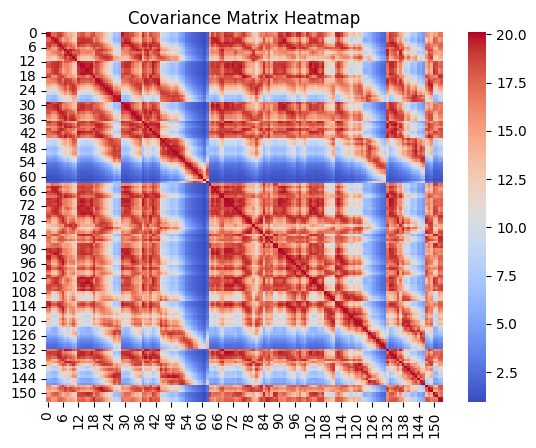

In [142]:

K = model.kernel_(x_train)  
sns.heatmap(K, cmap="coolwarm")
plt.title("Covariance Matrix Heatmap")
plt.show()

In [153]:
kernel = 1.0 * RBF()

gpc = GaussianProcessClassifier(kernel=kernel)

param_grid = {
    "kernel__k2__length_scale": [0.5, 1.0, 2.0, 5.0]
}

grid_search = GridSearchCV(gpc, param_grid, cv=5)
grid_search.fit(x_train, y_train)

print("Best parameters:", grid_search.best_params_)



Best parameters: {'kernel__k2__length_scale': 2.0}
